# <FONT size="10pt"> <center>Projet 4</center></FONT>


### Notebook 1

#### <FONT size="10pt"> <center>Anticipez les besoins en consommation de bâtiments</center></FONT>


Vous travaillez pour la ville de **Seattle**. Pour atteindre son objectif de ville neutre en émissions de carbone en 2050, votre équipe s’intéresse de près à **la consommation et aux émissions des bâtiments non destinés à l’habitation**.

Des relevés minutieux ont été effectués par les agents de la ville en **2016**. Voici les données et leur source. Cependant, ces relevés sont coûteux à obtenir, et à partir de ceux déjà réalisés, vous voulez tenter de **prédire les émissions de CO2** et la **consommation totale d’énergie de bâtiments non destinés à l’habitation** pour lesquels elles n’ont pas encore été mesurées.

Votre prédiction se basera sur **les données structurelles des bâtiments (taille et usage des bâtiments, date de construction, situation géographique, ...)**

Vous cherchez également à évaluer l’intérêt de **l’"ENERGY STAR Score"** pour la prédiction d’émissions (expliqué sur ce site en anglais : www.energystar.gov), qui est fastidieux à calculer avec l’approche utilisée actuellement par votre équipe. Vous l'intégrerez dans la modélisation et jugerez de son intérêt.

Vous sortez tout juste d’une réunion de brief avec votre équipe. Voici un récapitulatif de votre mission :

- **Réaliser une courte analyse exploratoire.**
- **Tester différents modèles de prédiction afin de répondre au mieux à la problématique.**

Avant de quitter la salle de brief, Douglas, le project lead, vous donne quelques pistes et erreurs à éviter :

Douglas : L’objectif est de te passer des relevés de consommation annuels futurs (attention à la fuite de données). Nous ferons de toute façon pour tout nouveau bâtiment un premier relevé de référence la première année, donc rien ne t'interdit d’en déduire des variables structurelles aux bâtiments, par exemple la nature et proportions des sources d’énergie utilisées.. 

Fais bien attention au traitement des différentes variables, à la fois pour trouver de nouvelles informations (peut-on déduire des choses intéressantes d’une simple adresse ?) et optimiser les performances en appliquant des transformations simples aux variables (**normalisation, passage au log, etc.**).

Mets en place une évaluation rigoureuse des performances, et optimise les hyperparamètres et le choix d’algorithmes de ML à l’aide d’une validation croisée. Tu testeras au minimum 4 algorithmes de famille différente (par exemple : ElasticNet, SVM, GradientBoosting, RandomForest).

### Livrables

- Un notebook de l'analyse exploratoire mis au propre et annoté.
- Un notebook pour chaque prédiction (émissions de CO2 et consommation totale d’énergie) des différents tests de modèles mis au propre, dans lequel vous identifierez clairement le modèle final choisi.
- Un support de présentation pour la soutenance (entre 15 et 25 slides).

## I- IMPORTATION DES LIBRAIRIES ET DES DONNEES

In [962]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import math
import missingno as msno
import folium
import random
import branca.colormap as cm
import scipy
import os
from ipyleaflet import Map, Marker, basemaps

pd.set_option('mode.chained_assignment', None) # Pour éviter la survenue de messages d'erreur lors de la création
                                                 # d'un nouveau dataframe à partir d'un existant

from warnings import filterwarnings
filterwarnings('ignore')  # code optionnel

pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 200)

In [963]:
# Commençons par regarder les données :

data = pd.read_csv('2016_Building_Energy_Benchmarking.csv')
data.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.00,0659000030,7,DOWNTOWN,47.61,-122.34,1927,1.00,12,88434,0,88434,Hotel,Hotel,88434.00,NaN,NaN,NaN,NaN,NaN,60.00,81.70,84.30,182.50,189.00,7226362.50,7456910.00,2003882.00,1156514.25,3946027.00,12764.53,1276453.00,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.00,0659000220,7,DOWNTOWN,47.61,-122.33,1996,1.00,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.00,Parking,15064.00,Restaurant,4622.00,NaN,61.00,94.80,97.90,176.10,179.40,8387933.00,8664479.00,0.00,950425.19,3242851.00,51450.82,5145082.00,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.00,0659000475,7,DOWNTOWN,47.61,-122.34,1969,1.00,41,956110,196718,759392,Hotel,Hotel,756493.00,NaN,NaN,NaN,NaN,NaN,43.00,96.00,97.70,241.90,244.10,72587024.00,73937112.00,21566554.00,14515435.00,49526664.00,14938.00,1493800.00,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.00,0659000640,7,DOWNTOWN,47.61,-122.34,1926,1.00,10,61320,0,61320,Hotel,Hotel,61320.00,NaN,NaN,NaN,NaN,NaN,56.00,110.80,113.30,216.20,224.00,6794584.00,6946800.50,2214446.25,811525.31,2768924.00,18112.13,1811213.00,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.00,0659000970,7,DOWNTOWN,47.61,-122.34,1980,1.00,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.00,Parking,68009.00,Swimming Pool,0.00,NaN,75.00,114.80,118.70,211.40,215.60,14172606.00,14656503.00,0.00,1573448.62,5368607.00,88039.98,8803998.00,False,NaN,Compliant,NaN,505.01,2.88


In [964]:
data.shape

(3376, 46)

In [965]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3376 entries, 0 to 3375
Data columns (total 46 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    3376 non-null   int64  
 1   DataYear                         3376 non-null   int64  
 2   BuildingType                     3376 non-null   object 
 3   PrimaryPropertyType              3376 non-null   object 
 4   PropertyName                     3376 non-null   object 
 5   Address                          3376 non-null   object 
 6   City                             3376 non-null   object 
 7   State                            3376 non-null   object 
 8   ZipCode                          3360 non-null   float64
 9   TaxParcelIdentificationNumber    3376 non-null   object 
 10  CouncilDistrictCode              3376 non-null   int64  
 11  Neighborhood                     3376 non-null   object 
 12  Latitude            

In [966]:
data.duplicated().sum()

0

## II- Analyse des valeurs manquantes

In [967]:
# Calcul du nombre total de valeurs manquantes dans le DataFrame
total_nans = data.isna().sum().sum()

# Calcul du nombre total de cases dans le DataFrame
total_cases = data.shape[0] * data.shape[1]

# Affichage du nombre total de valeurs manquantes et de cases, ainsi que le pourcentage de valeurs manquantes
print(f"Nous observons {total_nans} NaNs dans toute la DataFrame.")
print(f"Nous observons {total_cases} cases dans la DataFrame.")
print(f"Pourcentage de NaNs dans la DataFrame : {round((total_nans / total_cases) * 100)}%")

Nous observons 19952 NaNs dans toute la DataFrame.
Nous observons 155296 cases dans la DataFrame.
Pourcentage de NaNs dans la DataFrame : 13%


- **Nous pouvons voir que 13% des données sont manquantes dans notre jeu de données.**

In [968]:
# Calcul du pourcentage de remplissage par colonne et tri par ordre croissant
pourcentage_remplissage_colonne = (data.notna().mean() * 100).to_frame().sort_values(0).round(4)

# Affichage des 30 premières lignes
print(pourcentage_remplissage_colonne.head(30))

# Comptage des pourcentages arrondis et leurs occurrences
count_pourcentage_arrondi = round(pourcentage_remplissage_colonne).value_counts()

# Affichage du compte des pourcentages arrondis
print(count_pourcentage_arrondi)

                                     0
Comments                          0.00
Outlier                           0.95
YearsENERGYSTARCertified          3.52
ThirdLargestPropertyUseType      17.65
ThirdLargestPropertyUseTypeGFA   17.65
SecondLargestPropertyUseType     49.73
SecondLargestPropertyUseTypeGFA  49.73
ENERGYSTARScore                  75.03
LargestPropertyUseTypeGFA        99.41
LargestPropertyUseType           99.41
ZipCode                          99.53
TotalGHGEmissions                99.73
SourceEUIWN(kBtu/sf)             99.73
SteamUse(kBtu)                   99.73
Electricity(kWh)                 99.73
Electricity(kBtu)                99.73
NaturalGas(therms)               99.73
NaturalGas(kBtu)                 99.73
SourceEUI(kBtu/sf)               99.73
ListOfAllPropertyUseTypes        99.73
GHGEmissionsIntensity            99.73
NumberofBuildings                99.76
SiteEUI(kBtu/sf)                 99.79
SiteEUIWN(kBtu/sf)               99.82
SiteEnergyUseWN(kBtu)    

- **La DataFrame contient plusieurs colonnes avec des valeurs manquantes.**
- **Seules 36 colonnes sont remplies à 100% ou presque 100% ou presque.**

In [969]:
# Suppression des colonnes vides
data = data.dropna(axis=1, how='all')

In [970]:
# Colonnes de consommation énergétique
consommation_energetique = ['SiteEUI(kBtu/sf)', 'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
                            'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)', 'Electricity(kWh)',
                            'Electricity(kBtu)', 'NaturalGas(therms)', 'NaturalGas(kBtu)']

# Calcul du pourcentage de valeurs nulles pour chaque ligne dans les colonnes de consommation énergétique
conso_energetique = data[consommation_energetique].isna().mean(axis=1).mul(100).round(2).rename('Pourcentage_Nul')

# Grouper et compter les pourcentages
conso_energetique = conso_energetique.reset_index().groupby('Pourcentage_Nul').count().T
conso_energetique

Pourcentage_Nul,0.00,9.09,18.18,63.64,100.00
index,3364,2,1,4,5


- **Il y a 5 lignes entièrement vides contenant uniquement des NaNs.**

- **Y a-t-il des lignes entièrement vides où la consommation est de 0 ?**

In [971]:
# Identifier les lignes avec 100% de valeurs nulles dans la consommation énergétique
index_lignes_vides = conso_energetique[conso_energetique[0] == 100].index

# Supprimer les lignes vides identifiées
data_apres_suppression = data.drop(index=index_lignes_vides).reset_index(drop=True)

In [972]:
# Calcul de la consommation totale d'énergie pour chaque ligne
consommation_totale = data[consommation_energetique].sum(axis=1).round(2).to_frame()

# Sélection des lignes avec une consommation totale d'énergie égale à zéro
zero_conso = consommation_totale[consommation_totale[0] == 0]
zero_conso

,0
28,0.00
152,0.00
304,0.00
578,0.00
746,0.00
758,0.00
760,0.00
1361,0.00
1549,0.00
1792,0.00


- **Il y a 12 bâtiments sans aucune consommation énergétique.**

In [973]:
# Identifier les lignes avec une consommation totale d'énergie égale à zéro
index_lignes_vides = zero_conso[zero_conso[0] == 0].index

# Supprimer les lignes identifiées
data = data.drop(index=index_lignes_vides)

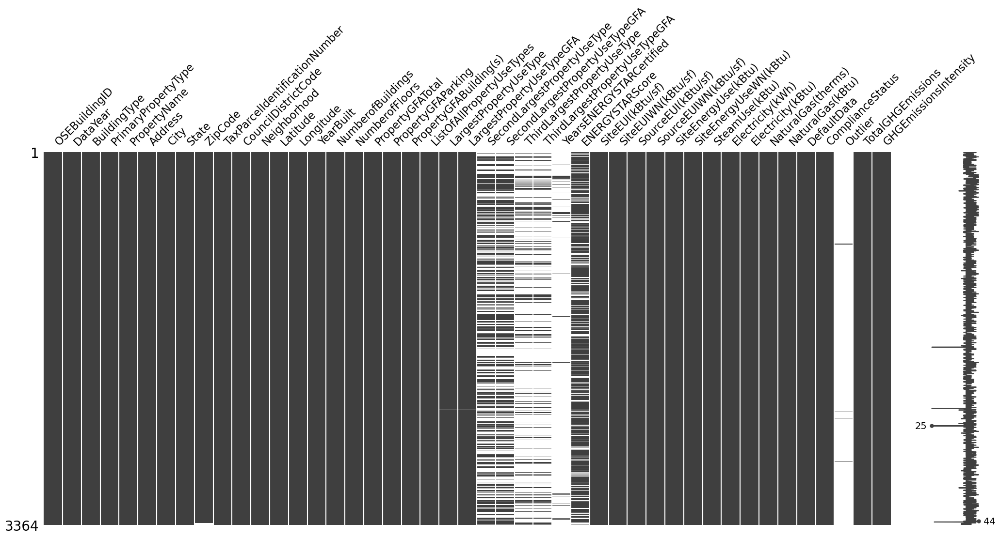

In [974]:
# Visualisation du remplissage avec missingo
msno.matrix(data)
plt.show()

- **Le DataFrame est principalement complet, à l'exception de six colonnes du mileu.**

In [975]:
# Compter les variables quantitatives et qualitatives
nb_variables_quantitatives = data.select_dtypes(exclude='object').shape[1]
nb_variables_qualitatives = data.select_dtypes(include='object').shape[1]

# Afficher le résultat
print('Nous avons', nb_variables_qualitatives, 'variables qualitatives.')
print('Nous avons', nb_variables_quantitatives, 'variables numériques.')

Nous avons 15 variables qualitatives.
Nous avons 30 variables numériques.


## Analyse des variables qualitatives (catégorielles)

In [976]:
# Sélectionner les colonnes de type 'object' (variables catégorielles)
data.select_dtypes(include = 'object')

,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,TaxParcelIdentificationNumber,Neighborhood,ListOfAllPropertyUseTypes,LargestPropertyUseType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType,YearsENERGYSTARCertified,ComplianceStatus,Outlier
0,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,0659000030,DOWNTOWN,Hotel,Hotel,NaN,NaN,NaN,Compliant,NaN
1,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,0659000220,DOWNTOWN,"Hotel, Parking, Restaurant",Hotel,Parking,Restaurant,NaN,Compliant,NaN
2,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,0659000475,DOWNTOWN,Hotel,Hotel,NaN,NaN,NaN,Compliant,NaN
3,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,0659000640,DOWNTOWN,Hotel,Hotel,NaN,NaN,NaN,Compliant,NaN
4,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,0659000970,DOWNTOWN,"Hotel, Parking, Swimming Pool",Hotel,Parking,Swimming Pool,NaN,Compliant,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3371,Nonresidential COS,Office,Horticulture building,1600 S Dakota St,Seattle,WA,1624049080,GREATER DUWAMISH,Office,Office,NaN,NaN,NaN,Error - Correct Default Data,NaN
3372,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,Seattle,WA,3558300000,DOWNTOWN,Other - Recreation,Other - Recreation,NaN,NaN,NaN,Compliant,NaN
3373,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,Seattle,WA,1794501150,MAGNOLIA / QUEEN ANNE,"Fitness Center/Health Club/Gym, Other - Recrea...",Other - Recreation,Fitness Center/Health Club/Gym,Swimming Pool,NaN,Compliant,NaN
3374,Nonresidential COS,Mixed Use Property,South Park Community Center,8319 8th Ave S,Seattle,WA,7883603155,GREATER DUWAMISH,"Fitness Center/Health Club/Gym, Food Service, ...",Other - Recreation,Fitness Center/Health Club/Gym,Pre-school/Daycare,NaN,Compliant,NaN


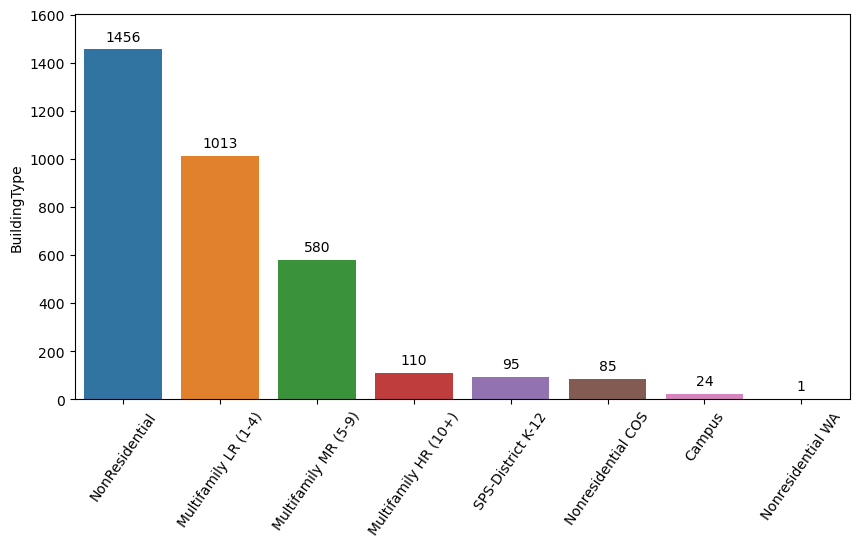

In [977]:
# BuildingType :
Graph1 = data['BuildingType'].value_counts().to_frame()

# Création du graphique à barres pour visualiser la distribution des types de bâtiments (BuildingType)
ax = plt.figure(figsize=(10,5))   # Création de la figure pour le graphique
ax = sns.barplot(x = Graph1.index, y = Graph1['BuildingType'])   # Création du graphique à barres
ax.bar_label(ax.containers[0], labels = list(Graph1['BuildingType']), padding=4)
plt.xticks(rotation = 55)  # Rotation des étiquettes sur l'axe x pour une meilleure lisibilité
ax.margins(y=0.1)
plt.show()  # Affichage du graphique

# Suppression des Multifamilly :
data = data[~data['BuildingType'].str.contains('Multifamily')].reset_index(drop = True)

- **Nous nous concentrons spécifiquement sur les bâtiments non résidentiels, donc nous supprimons les bâtiments multifamiliaux.**

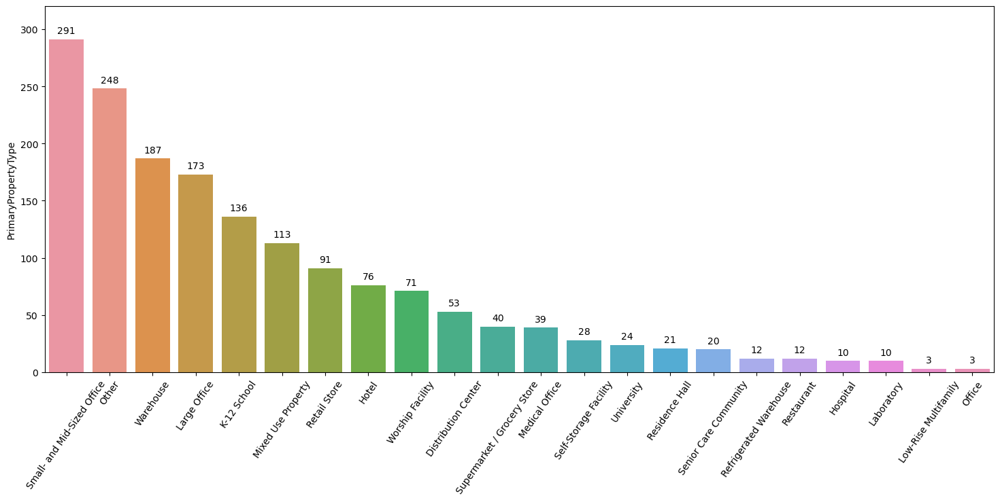

In [978]:
# Type de Propriété principale :
# Compter le nombre de chaque type de propriété principale (PrimaryPropertyType)
Graph2 = data['PrimaryPropertyType'].value_counts().to_frame()

# Création du graphique à barres pour visualiser la distribution des types de propriétés principales
ax = plt.figure(figsize=(18,7))  # Création de la figure pour le graphique
ax = sns.barplot(x=Graph2.index, y=Graph2['PrimaryPropertyType'])  # Création du graphique à barres
ax.bar_label(ax.containers[0], labels=list(Graph2['PrimaryPropertyType']), padding=4)  # Ajout des étiquettes sur les barres
plt.xticks(rotation=55)  # Rotation des étiquettes sur l'axe x pour une meilleure lisibilité
ax.margins(y=0.1)  # Marge supplémentaire sur l'axe y pour éviter la coupure des étiquettes
plt.show()  # Affichage du graphique

# Suppression des bâtiments de type 'Multifamily' ou 'Residence Hall' dans la colonne 'PrimaryPropertyType'
# Ces types de bâtiments sont retirés pour se concentrer sur les propriétés non résidentielles
data = data[~data['PrimaryPropertyType'].str.contains('Multifamily|Residence Hall')].reset_index(drop=True)

- **Indique le type principal de bâtiment.**
- **Précise la correspondance de chaque type de bâtiment.**
- **Des bâtiments de type MULTIFAMILY sont encore présents.**

In [979]:
# Obtenir les valeurs uniques pour chaque colonne spécifiée :
unique_addresses = data['Address'].unique()
unique_zip_codes = data['ZipCode'].unique()
unique_council_districts = data['CouncilDistrictCode'].unique()
unique_neighborhoods = data['Neighborhood'].unique()
unique_latitudes = data['Latitude'].unique()
unique_longitudes = data['Longitude'].unique()

# Calculer le nombre total de valeurs uniques pour chaque colonne :
total_addresses = len(unique_addresses)
total_zip_codes = len(unique_zip_codes)
total_council_districts = len(unique_council_districts)
total_neighborhoods = len(unique_neighborhoods)
total_latitudes = len(unique_latitudes)
total_longitudes = len(unique_longitudes)

# Affichage des résultats :
print("Addresses (Total:", total_addresses, "):", unique_addresses)
print("Zip Codes (Total:", total_zip_codes, "):", unique_zip_codes)
print("Council Districts (Total:", total_council_districts, "):", unique_council_districts)
print("Neighborhoods (Total:", total_neighborhoods, "):", unique_neighborhoods)
print("Latitudes (Total:", total_latitudes, "):", unique_latitudes)
print("Longitudes (Total:", total_longitudes, "):", unique_longitudes)


Addresses (Total: 1616 ): ['405 Olive way' '724 Pine street' '1900 5th Avenue' ... '1920 1st Ave W'
 '8319 8th Ave S' '2820 S Myrtle St']
Zip Codes (Total: 49 ): [98101. 98121. 98104. 98154. 98118. 98105. 98125. 98109. 98070. 98108.
 98199. 98115. 98107. 98144. 98103. 98119. 98136. 98122. 98126. 98133.
 98146. 98033. 98106. 98112. 98111. 98134. 98117. 98116. 98191. 98164.
 98195. 98185. 98181. 98102. 98168. 98155. 98006. 98124. 98053. 98013.
 98178. 98114. 98165. 98011. 98113. 98177. 98020. 98145.    nan]
Council Districts (Total: 7 ): [7 3 2 4 5 6 1]
Neighborhoods (Total: 19 ): ['DOWNTOWN' 'SOUTHEAST' 'NORTHEAST' 'EAST' 'NORTH' 'MAGNOLIA / QUEEN ANNE'
 'LAKE UNION' 'GREATER DUWAMISH' 'BALLARD' 'NORTHWEST' 'CENTRAL'
 'SOUTHWEST' 'DELRIDGE' 'Ballard' 'North' 'Delridge' 'Northwest' 'Central'
 'DELRIDGE NEIGHBORHOODS']
Latitudes (Total: 1469 ): [47.6122  47.61317 47.61393 ... 47.59625 47.52832 47.53939]
Longitudes (Total: 1381 ): [-122.33799 -122.33393 -122.3381  ... -122.35784 -122.32431

- **Les adresses des bâtiments sont répertoriées.**
- **Quelques codes postaux (ZipCode) sont manquants.**
- **Ces informations sont pertinentes pour la localisation géographique.**

In [980]:
# Noms des bâtiments uniques :
num_unique_properties = len(data['PropertyName'].unique())
print(num_unique_properties)

# Affichage des noms des bâtiments en double :
duplicated_properties = data[data['PropertyName'].duplicated(keep=False)]['PropertyName']
print(duplicated_properties)

# Suppression de la colonne 'PropertyName'
data = data.drop(columns=['PropertyName'])

1633
158           South Park
813       Canal Building
917     Bayview Building
949           South Park
992       Canal Building
1110         Airport Way
1128    Bayview Building
1131         Airport Way
Name: PropertyName, dtype: object


- **Les noms des bâtiments peuvent être utiles pour prédire la consommation énergétique.**

In [981]:
# Fonction pour regrouper la longitude et la latitude en coordonnées :
def GeoLoc(value):
    Lat, Long = value['Latitude'], value['Longitude']
    return [Lat, Long]

# Création de la colonne 'Coordonnees' en appliquant la fonction GeoLoc à chaque ligne :
data['Coordonnees'] = data[['Latitude', 'Longitude']].apply(GeoLoc, axis=1)

# Suppression des colonnes 'Latitude' et 'Longitude' maintenant regroupées en 'Coordonnees' :
data.drop(columns=['Latitude', 'Longitude'], inplace=True)

# Séparation des données avec et sans code postal (ZipCode) :
data_with_zip = data[data['ZipCode'].notna()]
data_without_zip = data[data['ZipCode'].isna()].reset_index(drop=True)

# Création d'une carte de folium centrée sur les premières coordonnées :
m = folium.Map(location=data_with_zip['Coordonnees'][0], zoom_start=11)

# Couleurs pour chaque district (CouncilDistrictCode) :
colors = ['red', 'green', 'yellow', 'orange', 'white', 'cyan', 'gold']

# Ajout de cercles pour chaque zone avec un ZipCode :
for district, color in zip(data_with_zip['CouncilDistrictCode'].unique(), colors):
    zone = data_with_zip[data_with_zip['CouncilDistrictCode'] == district]
    zone.reset_index(drop=True, inplace=True)
    for i in range(len(zone)):
        folium.Circle(location=zone['Coordonnees'][i], radius=10, color=color).add_to(m)

# Ajout de cercles (noire) pour les données sans ZipCode :
for j in range(len(data_without_zip)):
    folium.Circle(location=data_without_zip['Coordonnees'][j], radius=100, color='black').add_to(m)

# Affichage de la carte :
m

- **Toutes les coordonnées se trouvent à Seattle.**
- **Les bâtiments sans code postal (en noir) sont répartis dans divers districts, la colonne "Coordonnées" peut remplacer le code postal.**
- **Les coordonnées sont plus pertinentes que les adresses postales pour l'analyse.**

In [982]:
# Extraction des districts en éliminant les adresses postales.
data = data.drop(['Address', 'ZipCode'], axis=1)

In [983]:
# Convertir les noms de quartiers en majuscules et enlever 'NEIGHBORHOODS' :
data['Neighborhood'] = data['Neighborhood'].apply(lambda x: x.upper())
data['Neighborhood'] = data['Neighborhood'].apply(lambda x: x.replace(' NEIGHBORHOODS', ''))

# Nombre de quartiers uniques :
num_unique_neighborhoods = data['Neighborhood'].nunique()
print("Nombre de quartiers uniques :", num_unique_neighborhoods)

# Couleurs pour chaque quartier :
colors = ['red', 'green', 'yellow', 'orange', 'black', 'cyan', 'gold', 'purple', 'grey', 'white', 
          'brown', 'crimson', 'lime']

# Création de la carte Folium centrée sur les premières coordonnées :
m = folium.Map(location=data['Coordonnees'][0], zoom_start=11)

# Ajout de cercles pour chaque quartier :
for neighborhood, color in zip(data['Neighborhood'].unique(), colors):
    zone = data[data['Neighborhood'] == neighborhood]
    zone.reset_index(drop=True, inplace=True)
    for i in range(len(zone)):
        folium.Circle(location=zone['Coordonnees'][i], radius=10, color=color).add_to(m)

# Affichage de la carte :
m

Nombre de quartiers uniques : 13


- **Actuellement, il reste 13 quartiers.**
- **Les quartiers rouges et jaunes sont mélangés.**
- **Ceci représente un autre modèle de découpage.**

In [984]:
# Affichage des valeurs uniques pour Ville et Etat :
print(data['State'].unique())
print(data['City'].unique())

# Suppression des colonnes 'State' et 'City' du DataFrame
data = data.drop(columns=['State', 'City'])

['WA']
['Seattle']


- **C'est la même ville et l'État de Washington.**

In [985]:
# Types de propriété et surfaces des 3 plus grands bâtiments du groupe :
data['LargestPropertyUseType'].unique()
data['SecondLargestPropertyUseType'].unique()
data['ThirdLargestPropertyUseType'].unique()

array([nan, 'Restaurant', 'Swimming Pool', 'Data Center', 'Office',
       'Retail Store', 'Other - Entertainment/Public Assembly',
       'Non-Refrigerated Warehouse', 'Other', 'Distribution Center',
       'Food Service', 'Other - Services', 'Medical Office', 'Parking',
       'Other - Utility', 'K-12 School', 'Fitness Center/Health Club/Gym',
       'Social/Meeting Hall', 'Pre-school/Daycare',
       'Convenience Store without Gas Station', 'Financial Office',
       'Other - Restaurant/Bar', 'Other - Education',
       'Multifamily Housing', 'Laboratory', 'Bank Branch', 'Hotel',
       'Personal Services (Health/Beauty, Dry Cleaning, etc)',
       'Other - Recreation', 'Self-Storage Facility',
       'Other - Technology/Science', 'Refrigerated Warehouse',
       'Bar/Nightclub', 'Manufacturing/Industrial Plant',
       'Other/Specialty Hospital', 'Fast Food Restaurant',
       'Worship Facility', 'Supermarket/Grocery Store', 'Strip Mall',
       'Vocational School'], dtype=object)

- **Cela devient intéressant si l'on suppose que les plus grandes constructions consomment le plus.**
- **Ces colonnes sont parmi les plus vides, ce qui est compréhensible étant donné qu'il n'y a pas toujours de deuxième ou troisième bâtiment.**
- **Cependant, il y a des données manquantes pour le bâtiment principal, ce qui n'est pas habituel.**
- **Les données par bâtiment individuel sont plus intéressantes qu'en groupe, mais avons-nous les données de consommation pour chaque bâtiment ?**

In [986]:
# Afficher toutes les propriétés pour chaque construction :
data['ListOfAllPropertyUseTypes'].unique()

# Supprimer la colonne 'ListOfAllPropertyUseTypes' du DataFrame
data = data.drop(columns=['ListOfAllPropertyUseTypes'])

- **Il y a de nombreux types de propriétés différents à considérer, ce qui rend l'analyse complexe, car la consommation peut varier d'un type de bâtiment à un autre, ce qui est difficile à simplifier.**

In [987]:
# Sélection des lignes où la colonne 'LargestPropertyUseType' est vide :
data[data['LargestPropertyUseType'].isna()]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,Coordonnees
342,496,2016,NonResidential,Self-Storage Facility,1175001235,6,BALLARD,1946,2.00,2,111445,0,111445,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,47.80,51.00,103.00,106.40,5697472.50,6076957.00,0.00,881452.00,3007514.00,26899.58,2689958.00,False,Compliant,NaN,163.83,1.47,"[47.66838, -122.3931]"
808,21103,2016,NonResidential,Hotel,1977201140,7,DOWNTOWN,1910,1.00,8,61721,0,61721,NaN,NaN,NaN,NaN,NaN,NaN,NaN,93.00,52.20,53.50,150.40,154.40,2897079.75,2968429.75,0.00,742846.38,2534592.00,3624.88,362488.00,False,Compliant,NaN,36.92,0.60,"[47.61203, -122.34165]"
1333,25568,2016,NonResidential,Small- and Mid-Sized Office,4088804565,4,LAKE UNION,2008,1.00,4,48350,0,48350,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45.00,72.20,74.70,226.60,234.60,3168131.00,3280955.50,0.00,928526.00,3168131.00,0.00,0.00,False,Compliant,NaN,22.09,0.46,"[47.64747, -122.34086]"
1350,25711,2016,NonResidential,Restaurant,5247802410,2,DOWNTOWN,1913,1.00,3,28800,0,28800,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31.20,32.50,62.00,62.80,899924.19,935833.19,0.00,118085.30,402907.00,4970.17,497017.00,False,Compliant,NaN,29.21,1.01,"[47.59697, -122.32474]"


- **Trois constructions ont seulement un bâtiment, ce qui n'est pas un problème. Cependant, la construction avec deux bâtiments posera un problème.**
- **Ces colonnes sont-elles utiles si nous n'avons pas les données de consommation par bâtiment mais seulement une consommation globale ?**

In [988]:
# Remplacement des NaN pour les bâtiments ayant 0 Largest PropertyUseType :
ListIndex = data[data['LargestPropertyUseType'].isna() & (data['NumberofBuildings'] == 1)].index
for Ind in ListIndex:
    # Remplacer NaN par la superficie du bâtiment si un seul bâtiment
    data.at[Ind, 'LargestPropertyUseTypeGFA'] = data.at[Ind, 'PropertyGFABuilding(s)']
    # Remplacer NaN par le type de propriété principal si un seul bâtiment
    data.at[Ind, 'LargestPropertyUseType'] = data.at[Ind, 'PrimaryPropertyType']

# Suppression des autres ne pouvant récupérer les informations :
# Supprimer les lignes avec NaN dans 'LargestPropertyUseType' et réindexer
data = data.dropna(subset=['LargestPropertyUseType']).reset_index(drop=True)

In [989]:
# Année de certification de l'ENERGY STAR Score :
print(data['YearsENERGYSTARCertified'].unique())
print("Pourcentage de NaN dans YearsENERGYSTARCertified :", round(data['YearsENERGYSTARCertified'].isna().mean(),2))

# Note moyenne ENERGY STAR Score certifié et non certifié :
print("Moyenne de ENERGY STAR Score non certifié :", round(data[data['YearsENERGYSTARCertified'].isna()]['ENERGYSTARScore'].mean(),2))  
print("Moyenne de ENERGY STAR Score certifié :", round(data[data['YearsENERGYSTARCertified'].notna()]['ENERGYSTARScore'].mean(),2))       

# Suppression de la colonne 'YearsENERGYSTARCertified'
del data['YearsENERGYSTARCertified']

[nan '2016' '2014' '2012' '20172015'
 '2017201620152014201320122011201020092008' '201020092007' '201720102007'
 '20162015' '20152014201220112009' '201220092008'
 '201620152014201320112010200920072000' '201620092008' '201620142012'
 '20162015201420122008'
 '2016201520142013201220112010200920082007200620052004' '201520142013'
 '2014201320112010200920082007' '2016201520142013'
 '2017201620152014201320112008' '201720162015201420132008'
 '20162015201320122010' '2015201320122010' '20162011201020092008' '2007'
 '2010' '20172016201520092008' '2017201320092008' '2015' '2017'
 '2017201120102007' '201720162014201320122011201020092007'
 '201720152014201220102008' '20092005' '2017201520142013' '201620152012'
 '2012201020072006' '20112009' '2009' '201620152014201320092008'
 '201620152014201320112009' '2016201520142013201220112010' '201720162012'
 '20102008' '201620142012201120082007' '2017201520142013201120092008'
 '2016201520142013201220102009' '2016201120102009' '2016201520122009'
 '20162012' '201

- **La liste des années de certification n'est pas très utile.**
- **La variable est vide à 94%.**
- **Pour être certifié, il faut avoir un score supérieur à 75 (voir le .info()). On remarque que la moyenne des certifiés est de 85, tandis que celle des non-certifiés est de 63.6.**

In [990]:
# Régardons les outliers :
print("Nombres d'outliers :", len(data[data['Outlier'].notna()]))
# Filtrer les lignes où 'Outlier' n'est pas NaN
data = data[data['Outlier'].isna()]

# Supprimer la colonne 'Outlier'
del data['Outlier']

Nombres d'outliers : 16


- **Observation : Si une propriété est une valeur aberrante élevée ou basse (O/N) par rapport à quoi ?**

In [991]:
# Analyse des données par défaut (DefaultData) :
data[data['DefaultData'] == True][['LargestPropertyUseType', 'ComplianceStatus']].value_counts()

# Nombre de lignes avec DefaultData à True :
print("Nombre de lignes avec DefaultData à True :", len(data[data['DefaultData'] == True]))

# Filtrage des lignes avec DefaultData à False et réindexation :
data = data[data['DefaultData'] == False].reset_index(drop=True)

# Suppression des colonnes 'DefaultData' et 'ComplianceStatus' :
del data['DefaultData']
del data['ComplianceStatus']

Nombre de lignes avec DefaultData à True : 85


- **Observation : La propriété a utilisé des données par défaut pour au moins une caractéristique de la propriété.**

- **Observation : Si une propriété a satisfait aux exigences d'analyse comparative énergétique pour l'année de déclaration en cours. Mais laquelle ?**

## Analyse des variables quantitatives (numériques)

In [992]:
# Sélectionner les colonnes de type 'numerique' (variables catégorielles)
data.select_dtypes(exclude = 'object')

,OSEBuildingID,DataYear,CouncilDistrictCode,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,7,1927,1.00,12,88434,0,88434,88434.00,NaN,NaN,60.00,81.70,84.30,182.50,189.00,7226362.50,7456910.00,2003882.00,1156514.25,3946027.00,12764.53,1276453.00,249.98,2.83
1,2,2016,7,1996,1.00,11,103566,15064,88502,83880.00,15064.00,4622.00,61.00,94.80,97.90,176.10,179.40,8387933.00,8664479.00,0.00,950425.19,3242851.00,51450.82,5145082.00,295.86,2.86
2,3,2016,7,1969,1.00,41,956110,196718,759392,756493.00,NaN,NaN,43.00,96.00,97.70,241.90,244.10,72587024.00,73937112.00,21566554.00,14515435.00,49526664.00,14938.00,1493800.00,2089.28,2.19
3,5,2016,7,1926,1.00,10,61320,0,61320,61320.00,NaN,NaN,56.00,110.80,113.30,216.20,224.00,6794584.00,6946800.50,2214446.25,811525.31,2768924.00,18112.13,1811213.00,286.43,4.67
4,8,2016,7,1980,1.00,18,175580,62000,113580,123445.00,68009.00,0.00,75.00,114.80,118.70,211.40,215.60,14172606.00,14656503.00,0.00,1573448.62,5368607.00,88039.98,8803998.00,505.01,2.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1530,50221,2016,1,1982,1.00,1,18261,0,18261,18261.00,NaN,NaN,NaN,51.00,56.20,126.00,136.60,932082.12,1025432.12,0.00,185334.70,632362.01,2997.20,299720.00,20.33,1.11
1531,50223,2016,2,2004,1.00,1,16000,0,16000,16000.00,NaN,NaN,NaN,59.40,65.90,114.20,118.90,950276.19,1053705.75,0.00,116221.00,396546.05,5537.30,553729.98,32.17,2.01
1532,50224,2016,7,1974,1.00,1,13157,0,13157,7583.00,5574.00,0.00,NaN,438.20,460.10,744.80,767.80,5765898.00,6053764.50,0.00,525251.69,1792158.76,39737.39,3973739.06,223.54,16.99
1533,50225,2016,1,1989,1.00,1,14101,0,14101,6601.00,6501.00,484.00,NaN,51.00,55.50,105.30,110.80,719471.19,782841.31,0.00,102248.00,348870.18,3706.01,370601.00,22.11,1.57


## les variables quantitatives hors consommation

In [993]:
# Année des données :
print(data['DataYear'].unique())

# Suppression de la colonne 'DataYear'
data = data.drop(columns=['DataYear'])

[2016]


- **Colonne inutile.**

In [994]:
# Affichage des valeurs uniques de l'ID OSE :
print(data['OSEBuildingID'].unique())

# Affichage du nombre total d'ID OSE uniques :
print("Nombre unique d'ID OSE :", data['OSEBuildingID'].nunique())

# Suppression de la colonne 'OSEBuildingID' (ID OSE)
data = data.drop(columns=['OSEBuildingID'])

[    1     2     3 ... 50224 50225 50226]
Nombre unique d'ID OSE : 1535


- **Colonne correcte, sans doublons, mais non pertinente.**

In [995]:
data['TaxParcelIdentificationNumber'].unique()

array(['0659000030', '0659000220', '0659000475', ..., '3558300000',
       '7883603155', '7857002030'], dtype=object)

In [996]:
# Nombre d'occurrences par numéro de taxe de la parcelle :
print(data['TaxParcelIdentificationNumber'].value_counts().head())

# Filtrer les lignes avec un numéro de taxe de parcelle spécifique :
data[data['TaxParcelIdentificationNumber'] == '7857002030']

# Suppression de la colonne 'TaxParcelIdentificationNumber'
del data['TaxParcelIdentificationNumber']

0925049346    5
3224049012    5
3624039009    4
1625049001    4
7666203240    4
Name: TaxParcelIdentificationNumber, dtype: int64


- **Apparemment inutile, cependant, certains de ces identifiants sont répétés, parfois jusqu'à deux, trois fois. Il semble qu'il y ait l'ajout de bâtiments pour un même ensemble.**

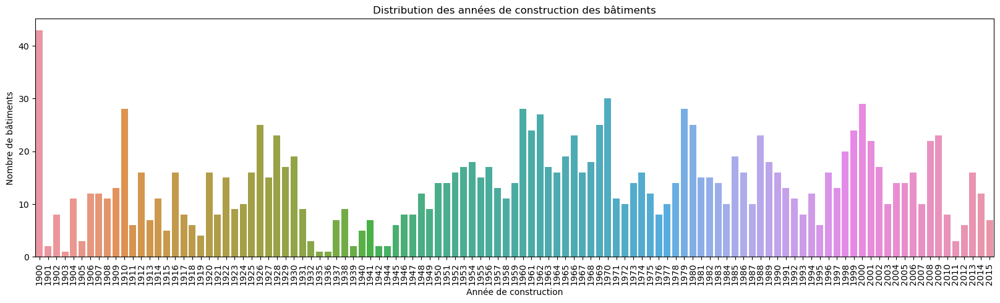

In [997]:
# Distribution des années de construction des bâtiments :
Annee = data['YearBuilt'].value_counts().to_frame().reset_index().sort_values('index')

# Création du graphique barplot :
plt.figure(figsize=(20, 5))
sns.barplot(x=Annee['index'], y=Annee['YearBuilt'])
plt.xticks(rotation=90)
plt.xlabel("Année de construction")
plt.ylabel("Nombre de bâtiments")
plt.title("Distribution des années de construction des bâtiments")
plt.show()

- **Il n'y a pas d'augmentation du nombre de constructions en fonction des années.**
- **Supposition : tous les bâtiments antérieurs à 1900 sont regroupés dans la colonne 1900, car c'est l'année avec le plus de constructions.**
- **Les bâtiments les plus anciens datent de 1900.**


- **source internet: 1851 > Fondation de la ville de Seattle. 1910 > Croissance rapide de la ville, la population atteint 250 000 habitants, devenant la principale cité du Pacifique Nord-Ouest.**   (https://www.petitfute.com/v56856-seattle/guide-touristique/c60446-histoire.html#:~:text=1851%20%3E%20Fondation%20de%20la%20ville,Cr%C3%A9ation%20du%20port%20de%20Seattle.)

In [998]:
# Discrétisation des années de construction par décennie :
def discretisation_annees(value):
    return math.floor(value/10)*10

# Ajout de la colonne 'YearBuiltDec' pour les années par décennie :
# Insertion d'une colonne 'YearBuiltDec' à l'index 4 avec des valeurs par défaut de 0
data.insert(4, "YearBuiltDec", 0, allow_duplicates=False)
# Appliquer la fonction de discrétisation aux années de construction pour remplir 'YearBuiltDec'
data['YearBuiltDec'] = data['YearBuilt'].apply(discretisation_annees)

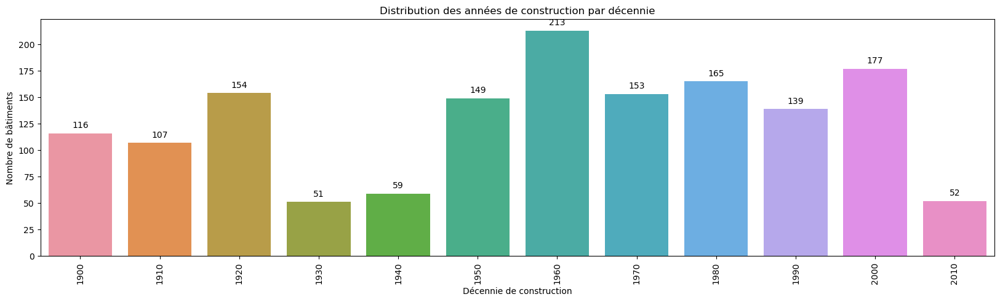

In [999]:
# Création du graphique barplot avec étiquettes :
plt.figure(figsize=(20, 5))
ax = sns.barplot(x=data['YearBuiltDec'].value_counts().index, y=data['YearBuiltDec'].value_counts().values)

# Ajout des étiquettes avec les valeurs au-dessus des barres
for p in ax.patches:
    # Annotation des valeurs
    ax.annotate(format(p.get_height(), '.0f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', 
                xytext=(0, 9), 
                textcoords='offset points')

plt.xticks(rotation=90)
plt.xlabel("Décennie de construction")
plt.ylabel("Nombre de bâtiments")
plt.title("Distribution des années de construction par décennie")
plt.show()

- **La construction des bâtiments ne semble pas évoluer au fil des décennies.**

In [1000]:
# Création de la carte avec la répartition des bâtiments par décennie :
colormap = cm.LinearColormap(colors=['red', 'yellow', 'green'], vmin=1900, vmax=2010)

# Initialisation de la carte Folium
m = folium.Map(location=data['Coordonnees'][0], zoom_start=11)

# Ajout des cercles pour chaque bâtiment avec une couleur basée sur la décennie
for i in range(len(data)): 
    folium.Circle(
        location=data['Coordonnees'][i], 
        radius=10, 
        fill=True,
        color=colormap(data.iloc[i]['YearBuiltDec']),
        fill_opacity=0.2        
    ).add_to(m)

# Ajout de la légende de couleur à la carte
m.add_child(colormap)

- **La plupart des bâtiments les plus anciens sont principalement construits dans le centre-ville.**

In [1001]:
# Moyenne des années de construction par quartier ou district :
print("Moyenne des années de construction par CouncilDistrictCode :")
# Calcul de la moyenne des années de construction par 'CouncilDistrictCode'
average_by_district = data.groupby('CouncilDistrictCode')['YearBuilt'].mean().round().astype(int).sort_values()
print(average_by_district)
print()

print("Moyenne des années de construction par Neighborhood :")
# Calcul de la moyenne des années de construction par 'Neighborhood'
average_by_neighborhood = data.groupby('Neighborhood')['YearBuilt'].mean().round().astype(int).sort_values()
print(average_by_neighborhood)

# Affichage de la colonne 'YearBuilt'
data['YearBuilt']

Moyenne des années de construction par CouncilDistrictCode :
CouncilDistrictCode
3    1957
7    1958
2    1960
6    1964
4    1966
1    1971
5    1977
Name: YearBuilt, dtype: int32

Moyenne des années de construction par Neighborhood :
Neighborhood
DOWNTOWN                 1947
EAST                     1949
SOUTHWEST                1958
BALLARD                  1961
GREATER DUWAMISH         1961
CENTRAL                  1963
NORTHEAST                1966
MAGNOLIA / QUEEN ANNE    1971
NORTHWEST                1973
NORTH                    1975
DELRIDGE                 1977
LAKE UNION               1977
SOUTHEAST                1979
Name: YearBuilt, dtype: int32


0       1927
1       1996
2       1969
3       1926
4       1980
        ... 
1530    1982
1531    2004
1532    1974
1533    1989
1534    1938
Name: YearBuilt, Length: 1535, dtype: int64

- **Le district avec la moyenne des bâtiments les plus récents est le cinquième, tandis que le troisième est le plus vieux.**
- **Les quartiers avec la moyenne des bâtiments les plus récents sont LAKE UNION et SOUTHEAST, tandis que le quartier le plus vieux est DOWNTOWN.**

In [1002]:
# Nombre de bâtiments par construction :

# Conversion de la colonne 'NumberofBuildings' en type entier
data['NumberofBuildings'] = data['NumberofBuildings'].astype(int)
# Décompte du nombre de bâtiments par construction
nb_buildings_counts = data['NumberofBuildings'].value_counts()
print(nb_buildings_counts)

1      1433
0        51
2        13
3        12
5         7
4         4
6         4
14        2
8         2
27        1
11        1
9         1
7         1
23        1
10        1
111       1
Name: NumberofBuildings, dtype: int64


In [1003]:
# Affichage des premières lignes avec NumberofBuildings égal à 0 :
df_zero_buildings = data[data['NumberofBuildings'] == 0].head()
df_zero_buildings

,BuildingType,PrimaryPropertyType,CouncilDistrictCode,Neighborhood,YearBuiltDec,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,Coordonnees
58,NonResidential,Medical Office,3,EAST,1960,1965,0,3,179014,0,179014,Medical Office,179014.00,NaN,NaN,NaN,NaN,48.00,93.30,92.30,213.40,210.30,16701055.00,16527711.00,0.00,2897562.75,9886484.00,68145.70,6814570.00,430.84,2.41,"[47.61244, -122.3214]"
71,NonResidential,Small- and Mid-Sized Office,7,MAGNOLIA / QUEEN ANNE,1980,1986,0,2,66240,2352,63888,Office,45900.00,Data Center,5181.00,Distribution Center,4551.00,NaN,74.90,75.40,235.20,236.60,4166306.25,4192107.75,0.00,1221074.25,4166305.00,0.00,0.00,29.04,0.44,"[47.62391, -122.34837]"
132,NonResidential,Warehouse,1,GREATER DUWAMISH,1910,1916,0,4,79600,0,79600,Non-Refrigerated Warehouse,79600.00,NaN,NaN,NaN,NaN,34.00,30.30,30.30,95.10,95.10,2411402.25,2411402.25,0.00,706741.50,2411402.00,0.00,0.00,16.81,0.21,"[47.57507, -122.35747]"
157,NonResidential,Large Office,7,DOWNTOWN,1960,1968,0,3,100734,26731,74003,Office,100734.00,NaN,NaN,NaN,NaN,20.00,97.20,98.20,305.10,308.40,9788717.00,9892566.00,0.00,2868908.50,9788716.00,0.00,0.00,68.24,0.68,"[47.61757, -122.35122]"
196,NonResidential,Small- and Mid-Sized Office,4,NORTHEAST,1960,1961,0,5,99005,0,99005,Office,79555.00,NaN,NaN,NaN,NaN,70.00,59.40,63.00,137.60,140.70,4728488.50,5008123.50,0.00,839159.31,2863212.00,18652.77,1865277.00,119.03,1.20,"[47.661, -122.31626]"


- **Certains bâtiments ont une valeur de 0 pour le nombre de bâtiments, malgré leur présence.**

In [1004]:
# Remplacement des buildings à 0 par la moyenne par quartier/étages/surfaces :
# Obtenir les index des lignes avec NumberofBuildings égal à 0
zero_buildings_index = data[data['NumberofBuildings'] == 0].index

# Création d'un DataFrame avec les colonnes pertinentes pour le remplacement
df_building_info = data[['Neighborhood', 'PropertyGFATotal', 'NumberofBuildings', 'NumberofFloors']]
# Arrondissement de la surface totale à la centaine la plus proche
df_building_info['PropertyGFATotal'] = df_building_info['PropertyGFATotal'].round(-2)

# Parcourir les lignes avec NumberofBuildings égal à 0
for index in zero_buildings_index:
    # Extraire les informations du quartier, nombre d'étages et surface totale du bâtiment
    neighborhood = data.iloc[index]['Neighborhood']
    num_floors = data.iloc[index]['NumberofFloors']
    property_gfa = data.iloc[index]['PropertyGFATotal'].round(-2)
    
    # Calculer la moyenne des buildings pour le quartier, surface et nombre d'étages correspondants
    mean_buildings = df_building_info.groupby(['Neighborhood', 'PropertyGFATotal', 'NumberofFloors'])['NumberofBuildings'].mean().round().astype(int)[neighborhood][property_gfa][num_floors]
    
    # Remplacer la valeur de NumberofBuildings à l'index actuel par la moyenne calculée
    data.loc[index, 'NumberofBuildings'] = mean_buildings

In [1005]:
# Remplacement des bâtiments avec 0 building par la moyenne par quartier :
# Obtention des index des lignes avec NumberofBuildings égal à 0
zero_buildings_index = data[data['NumberofBuildings'] == 0].index

# Parcourir les lignes avec NumberofBuildings égal à 0
for index in zero_buildings_index:
    # Extraire le quartier de la ligne actuelle
    neighborhood = data.iloc[index]['Neighborhood']
    
    # Calculer la moyenne des buildings pour ce quartier
    mean_buildings = data.groupby('Neighborhood')['NumberofBuildings'].mean().round().astype(int)[neighborhood]
    
    # Remplacer la valeur de NumberofBuildings à l'index actuel par la moyenne calculée
    data.loc[index, 'NumberofBuildings'] = mean_buildings

In [1006]:
# Nombre d'étages les plus fréquents :
floor_counts = data['NumberofFloors'].value_counts().head(10)
print(floor_counts)

1     426
2     352
3     238
4     135
5     101
6      81
7      32
8      22
10     18
11     18
Name: NumberofFloors, dtype: int64


In [1007]:
# Affichage des premières lignes avec NumberofFloors égal à 0 :
df_zero_floors = data[data['NumberofFloors'] == 0].head()
df_zero_floors

,BuildingType,PrimaryPropertyType,CouncilDistrictCode,Neighborhood,YearBuiltDec,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,Coordonnees
136,NonResidential,Hotel,7,DOWNTOWN,1990,1999,1,0,934292,0,934292,Hotel,495536.00,Parking,438756.00,Restaurant,49700.00,NaN,117.90,120.50,272.90,278.20,65047284.00,66502836.00,0.00,11536962.00,39364114.00,256831.62,25683162.00,1638.46,1.75,"[47.61275, -122.3333]"
435,NonResidential,Medical Office,3,EAST,2000,2004,1,0,225982,0,225982,Medical Office,200184.00,NaN,NaN,NaN,NaN,53.00,102.70,103.70,246.90,245.30,20560622.00,20764814.00,7815663.00,3735333.25,12744957.00,0.00,0.00,692.12,3.06,"[47.60979, -122.32298]"
436,NonResidential,Mixed Use Property,7,DOWNTOWN,2000,2006,1,0,516407,0,516407,Parking,385196.00,Multifamily Housing,340236.00,Hotel,67627.00,31.00,76.30,78.90,199.20,202.00,39403320.00,40754364.00,0.00,8626261.00,29432803.00,99705.12,9970512.00,734.72,1.42,"[47.61783, -122.33729]"
508,NonResidential,Other,7,DOWNTOWN,1990,1999,1,0,947987,0,947987,Other - Mall,561684.00,Other - Entertainment/Public Assembly,100000.00,Restaurant,80000.00,NaN,62.30,62.10,195.60,194.90,46510960.00,46343304.00,0.00,13631581.00,46510954.00,0.00,0.00,324.25,0.34,"[47.61289, -122.33531]"
991,NonResidential,Medical Office,3,EAST,1940,1945,1,0,274568,0,274568,Medical Office,228133.00,Parking,135954.00,NaN,NaN,52.00,111.00,111.20,235.50,233.10,25311526.00,25358122.00,13296249.00,3521475.75,12015275.00,0.00,0.00,1110.07,4.04,"[47.60862, -122.32372]"


- **Certains bâtiments, y compris des hôtels, ont été enregistrés avec 0 étages, ce qui est improbable.**
- **Il est intéressant de considérer que plus un bâtiment est élevé en étages, plus il est susceptible de consommer davantage en énergie.**

In [1008]:
# Remplacement des étages à 0 par la moyenne par quartier/bâtiments/surfaces :
# Obtenir les index des bâtiments avec 0 étages
zero_floors_index = data[data['NumberofFloors'] == 0].index

# Création d'un DataFrame avec les colonnes pertinentes pour le remplacement
df_floors_info = data[['Neighborhood', 'PropertyGFATotal', 'NumberofBuildings', 'NumberofFloors']]
# Arrondissement de la surface totale à la centaine la plus proche
df_floors_info['PropertyGFATotal'] = df_floors_info['PropertyGFATotal'].round(-2)

# Parcourir les bâtiments avec 0 étages
for index in zero_floors_index:
    # Extraire les informations du quartier, nombre de bâtiments et surface totale du bâtiment
    neighborhood = data.iloc[index]['Neighborhood']
    num_buildings = data.iloc[index]['NumberofBuildings']
    property_gfa = data.iloc[index]['PropertyGFATotal'].round(-2)
    
    # Calculer la moyenne des étages pour le quartier, surface et nombre de bâtiments correspondants
    mean_floors = df_floors_info.groupby(['Neighborhood', 'PropertyGFATotal', 'NumberofBuildings'])['NumberofFloors'].mean().round().astype(int)[neighborhood][property_gfa][num_buildings]
    
    # Remplacer la valeur de NumberofFloors à l'index actuel par la moyenne calculée
    data.loc[index, 'NumberofFloors'] = mean_floors

In [1009]:
# Remplacement des étages à 0 par la moyenne par quartier :
# Obtention des index des bâtiments avec NumberofFloors égal à 0
zero_floors_index = data[data['NumberofFloors'] == 0].index

# Parcours des bâtiments avec NumberofFloors égal à 0
for index in zero_floors_index:
    # Extraction du quartier du bâtiment actuel
    neighborhood = data.iloc[index]['Neighborhood']
    
    # Calcul de la moyenne des étages pour ce quartier
    mean_floors = data.groupby('Neighborhood')['NumberofFloors'].mean().round().astype(int)[neighborhood]
    
    # Remplacement de la valeur de NumberofFloors à l'index actuel par la moyenne calculée
    data.loc[index, 'NumberofFloors'] = mean_floors

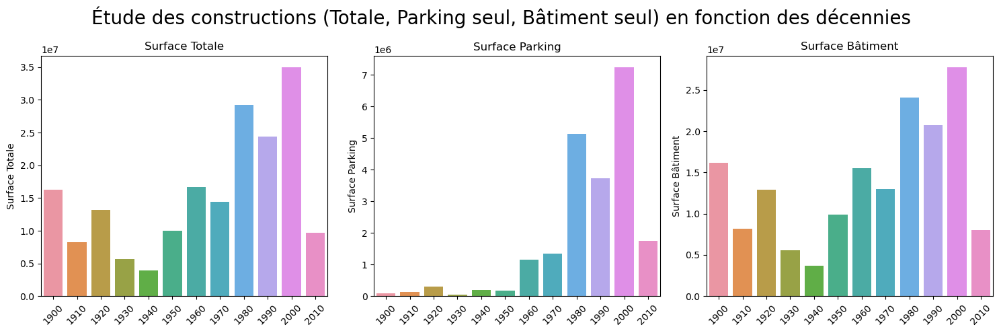

In [1010]:
# Étude de la surface totale, du parking et des bâtiments par décennie :
# Affichage des valeurs uniques pour les surfaces
unique_total = data['PropertyGFATotal'].unique()
unique_parking = data['PropertyGFAParking'].unique()
unique_building = data['PropertyGFABuilding(s)'].unique()

# Regroupement des surfaces par décennie
surface_by_decade = data.groupby('YearBuiltDec')[['PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)']].sum().reset_index()

# Création du graphique en barres
fig, ax = plt.subplots(ncols=3, figsize=(15, 5))
plt.suptitle('Étude des constructions (Totale, Parking seul, Bâtiment seul) en fonction des décennies', size=20)

# Graphique pour la surface totale
ax1 = plt.subplot(131)
ax1 = sns.barplot(x=surface_by_decade['YearBuiltDec'], y=surface_by_decade['PropertyGFATotal'])
plt.xticks(rotation=45)
plt.xlabel('')
plt.ylabel('Surface Totale')
plt.title('Surface Totale')

# Graphique pour la surface de parking
ax2 = plt.subplot(132)
ax2 = sns.barplot(x=surface_by_decade['YearBuiltDec'], y=surface_by_decade['PropertyGFAParking'])
plt.xticks(rotation=45)
plt.xlabel('')
plt.ylabel('Surface Parking')
plt.title('Surface Parking')

# Graphique pour la surface des bâtiments
ax3 = plt.subplot(133)
ax3 = sns.barplot(x=surface_by_decade['YearBuiltDec'], y=surface_by_decade['PropertyGFABuilding(s)'])
plt.xticks(rotation=45)
plt.xlabel('')
plt.ylabel('Surface Bâtiment')
plt.title('Surface Bâtiment')

plt.tight_layout()
plt.show()

- **Les variables les plus pertinentes pour la consommation d'énergie sont principalement celles liées aux surfaces totales des bâtiments, en particulier celles excluant les parkings.**
- **Une augmentation notable est observée au cours des 40 dernières années (jusqu'en 2010 s'arretant en 2015), principalement visible dans les données relatives aux "surface parkings".**

In [1011]:
# Création de la colormap en fonction des surfaces des bâtiments
colormap = cm.LinearColormap(colors=['green', 'yellow', 'red'], vmin=data['PropertyGFABuilding(s)'].min(), 
                             vmax=data['PropertyGFABuilding(s)'].max())

# Création de la carte Folium
m = folium.Map(location=data.Coordonnees[0], zoom_start=11)

# Parcours des bâtiments pour ajouter des cercles à la carte
for i in range(len(data)):
    # Ajout d'un cercle pour chaque bâtiment
    folium.Circle(
        location=data.Coordonnees[i],  # Coordonnées du bâtiment
        radius=(data.iloc[i]['PropertyGFABuilding(s)']) / 10000,  # Rayon proportionnel à la surface du bâtiment
        fill=True,
        color=colormap(data.iloc[i]['PropertyGFABuilding(s)']),  # Couleur selon la surface du bâtiment
        fill_opacity=0.2,
    ).add_to(m)

# Ajout de la colormap à la carte
m.add_child(colormap)

# Affichage de la carte
m

- **D'importantes surfaces de bâtiments sont observées dans le centre-ville.**

In [1012]:
# La colonne 'Coordonnees' est retirée afin de conserver uniquement les informations sur les quartiers et les districts.
data = data.drop(columns=['Coordonnees'])

In [1013]:
# ENERGYSTARScore :
# Obtenir les valeurs uniques des scores ENERGYSTAR
unique_scores = data['ENERGYSTARScore'].unique()

# Calculer le pourcentage de valeurs manquantes dans ENERGYSTARScore
missing_scores_percentage = round(data['ENERGYSTARScore'].isna().mean(),2)

# Afficher les valeurs uniques des scores ENERGYSTAR
print("Scores uniques ENERGYSTARScore:", unique_scores)

# Afficher le pourcentage de valeurs manquantes dans ENERGYSTARScore
print("Pourcentage de valeurs manquantes ENERGYSTARScore:", missing_scores_percentage)

Scores uniques ENERGYSTARScore: [ 60.  61.  43.  56.  75.  nan  27.  30.  36.  48.  58.  35.  31.  39.
  76.  84.  57.  29.   8.  97.  83.  95.  67.  78.  14.  71.  63.  98.
  99.  86.  80.  81.  94.  54.   1.  74.  96.  37.  91.  93.  68.  53.
  34. 100.  89.  92.  21.  10.  72.  87.  79.  70.  64.  49.  62.  46.
  42.  20.  90.  85.  66.  69.  28.  77.  88.  65.   3.  45.   2.  55.
  25.   6.  59.  19.   7.   5.  23.  38.  73.  33.  26.  41.  32.  82.
  15.  16.  50.  12.  51.  13.  11.  47.  18.  24.  17.  52.  44.   4.
  40.  22.   9.]
Pourcentage de valeurs manquantes ENERGYSTARScore: 0.36


- **Présences des valeurs manquantes à 36%.**


- **L'Environmental Protection Agency (EPA) a développé une échelle de notation de 1 à 100 pour évaluer la performance énergétique globale d'une propriété, en se basant sur des données nationales pour tenir compte des variations climatiques, des utilisations des bâtiments et des pratiques opérationnelles. Un score de 50 représente la médiane à l'échèlle nationale.**


- **Cette variable est intéressante pour la comparaison avec notre propre modèle, mais il serait utile de se référer au site spécifique de l'EPA pour comprendre son calcul exact** **(Lien :** https://search.energystar.gov/search?utf8=%25E2%259C%2593&m=&affiliate=www.energystar.gov&commit=Search&query=ENERGY+STAR+Score **).**

## les variables quantitatives de consommations

In [1014]:
# Etude des données de consommation :
# Variables liées à la consommation
consommation = ['SiteEUI(kBtu/sf)', 'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)',
                'SourceEUIWN(kBtu/sf)', 'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)',
                'SteamUse(kBtu)', 'Electricity(kWh)', 'Electricity(kBtu)',
                'NaturalGas(therms)', 'NaturalGas(kBtu)', 'TotalGHGEmissions',
                'GHGEmissionsIntensity']

# Description statistique des variables de consommation
df_consommation = data[consommation].describe()
df_consommation

,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
count,1535.00,1534.00,1535.00,1535.00,1535.00,1534.00,1535.00,1535.00,1535.00,1535.00,1535.00,1535.00,1535.00
mean,74.84,77.25,182.78,184.86,8875486.86,8450568.16,552595.73,1806327.50,6163189.41,20452.26,2045225.81,194.24,1.66
std,75.69,76.73,189.12,189.17,31437933.16,22873517.70,5742023.97,6330375.74,21599242.02,97508.66,9750866.41,782.32,2.42
min,0.00,0.00,0.00,-2.10,0.00,0.00,0.00,-33826.80,-115417.00,0.00,0.00,-0.80,-0.02
25%,34.65,36.65,79.60,82.00,1222024.69,1293945.59,0.00,213479.30,728391.50,0.00,0.00,20.15,0.35
50%,53.50,56.10,138.60,141.60,2688675.75,2796739.25,0.00,503262.19,1717131.00,4749.87,474987.00,49.58,0.88
75%,85.30,87.90,213.70,215.75,7320689.75,7516608.88,0.00,1543201.00,5265401.50,15316.22,1531622.00,147.31,1.95
max,834.40,834.40,2620.00,2620.00,873923712.00,471613856.00,134943456.00,192577488.00,657074389.00,2979090.00,297909000.00,16870.98,34.09


- **Il existe des valeurs de 0 et négatives dans les données.**
- **Les valeurs de 0 pour la consommation de vapeur (Steam) et de gaz naturel semblent plutôt logiques, mais pour les autres variables, cela peut sembler inhabituel.**


#### Consommation de Vapeur (Steam) :

1. **Inactivité ou Période de Non-Utilisation** : Les bâtiments peuvent parfois être inactifs pendant certaines périodes, comme les weekends ou les vacances, ce qui entraînerait une consommation de vapeur nulle.

2. **Système de Chauffage Alternatif** : Certains bâtiments peuvent avoir un système de chauffage principal autre que la vapeur, comme l'électricité ou le gaz, et n'utilisent la vapeur que comme appoint, ce qui peut conduire à des périodes où la consommation de vapeur est minime voire nulle.

3. **Maintenance ou Arrêt Temporaire** : Les installations de chauffage à la vapeur peuvent nécessiter une maintenance périodique ou peuvent être temporairement arrêtées, ce qui entraînerait une consommation de vapeur nulle pendant ces périodes.

#### Consommation de Gaz Naturel :

1. **Saisonnalité** : En fonction des saisons, notamment en été, lorsque le chauffage est moins nécessaire, la consommation de gaz naturel peut chuter à des niveaux proches de zéro.

2. **Chauffage Principal Électrique** : Certains bâtiments peuvent utiliser l'électricité comme source principale de chauffage, en particulier dans les régions où l'électricité est abondante et moins chère que le gaz naturel.

3. **Efficacité Énergétique** : Les bâtiments très efficaces sur le plan énergétique peuvent avoir des besoins en gaz naturel si bas que la consommation est proche de zéro.

In [1015]:
# Suppression des lignes avec des valeurs négatives dans 'SourceEUIWN(kBtu/sf)'
data = data[data['SourceEUIWN(kBtu/sf)'] >= 0].reset_index(drop=True)

# Affichage des types de propriétés avec une consommation d'électricité de 0
print("Types de propriétés avec une consommation d'électricité de 0:")
print(data[data['Electricity(kBtu)'] == 0]['PrimaryPropertyType'])
# Suppression des lignes avec une consommation d'électricité de 0
data = data[data['Electricity(kBtu)'] != 0]

print()

# Affichage des types de propriétés avec un 'SourceEUI(kBtu/sf)' de 0
print("Types de propriétés avec un 'SourceEUI(kBtu/sf)' de 0:")
print(data[data['SourceEUI(kBtu/sf)'] == 0]['PrimaryPropertyType'])
# Suppression des lignes avec un 'SourceEUI(kBtu/sf)' de 0
data = data[data['SourceEUI(kBtu/sf)'] != 0].reset_index(drop=True)

Types de propriétés avec une consommation d'électricité de 0:
112                     K-12 School
117                     K-12 School
377                      Restaurant
458     Supermarket / Grocery Store
1026                    K-12 School
1465                    K-12 School
Name: PrimaryPropertyType, dtype: object

Types de propriétés avec un 'SourceEUI(kBtu/sf)' de 0:
27             K-12 School
57             K-12 School
76             K-12 School
80             K-12 School
86             K-12 School
557            K-12 School
573            K-12 School
1356    Mixed Use Property
Name: PrimaryPropertyType, dtype: object


- **Il semble que les écoles n'aient pas de consommation d'électricité.**

les "propriétés avec un 'SourceEUI(kBtu/sf) de 0" désignent les bâtiments ou les propriétés où l'intensité de consommation d'énergie est mesurée à 0 kBtu/sf/année. Energy Use Intensity (EUI) ou Intensité de Consommation

In [1016]:
# Informations sur les variables de consommation
data[consommation].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1520 entries, 0 to 1519
Data columns (total 13 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   SiteEUI(kBtu/sf)       1520 non-null   float64
 1   SiteEUIWN(kBtu/sf)     1519 non-null   float64
 2   SourceEUI(kBtu/sf)     1520 non-null   float64
 3   SourceEUIWN(kBtu/sf)   1520 non-null   float64
 4   SiteEnergyUse(kBtu)    1520 non-null   float64
 5   SiteEnergyUseWN(kBtu)  1519 non-null   float64
 6   SteamUse(kBtu)         1520 non-null   float64
 7   Electricity(kWh)       1520 non-null   float64
 8   Electricity(kBtu)      1520 non-null   float64
 9   NaturalGas(therms)     1520 non-null   float64
 10  NaturalGas(kBtu)       1520 non-null   float64
 11  TotalGHGEmissions      1520 non-null   float64
 12  GHGEmissionsIntensity  1520 non-null   float64
dtypes: float64(13)
memory usage: 154.5 KB


- **Presence des valeurs NaN dans certaines colonnes.**

Pour la colonne "SiteEUI(kBtu/sf)" et la colonne "SiteEUIWN(kBtu/sf)":
    Coefficient Intercept : 1.96
    Coefficient Slope : 1.01
    Coefficient R² : 1.0
Pour la colonne "SourceEUI(kBtu/sf)" et la colonne "SourceEUIWN(kBtu/sf)":
    Coefficient Intercept : 3.24
    Coefficient Slope : 0.99
    Coefficient R² : 1.0
Pour la colonne "SiteEnergyUse(kBtu)" et la colonne "SiteEnergyUseWN(kBtu)":
    Coefficient Intercept : 3945933.14
    Coefficient Slope : 0.51
    Coefficient R² : 1.0
Pour la colonne "Electricity(kWh)" et la colonne "Electricity(kBtu)":
    Coefficient Intercept : 0.0
    Coefficient Slope : 3.41
    Coefficient R² : 1.0
Pour la colonne "NaturalGas(therms)" et la colonne "NaturalGas(therms)":
    Coefficient Intercept : 0.0
    Coefficient Slope : 1.0
    Coefficient R² : 1.0


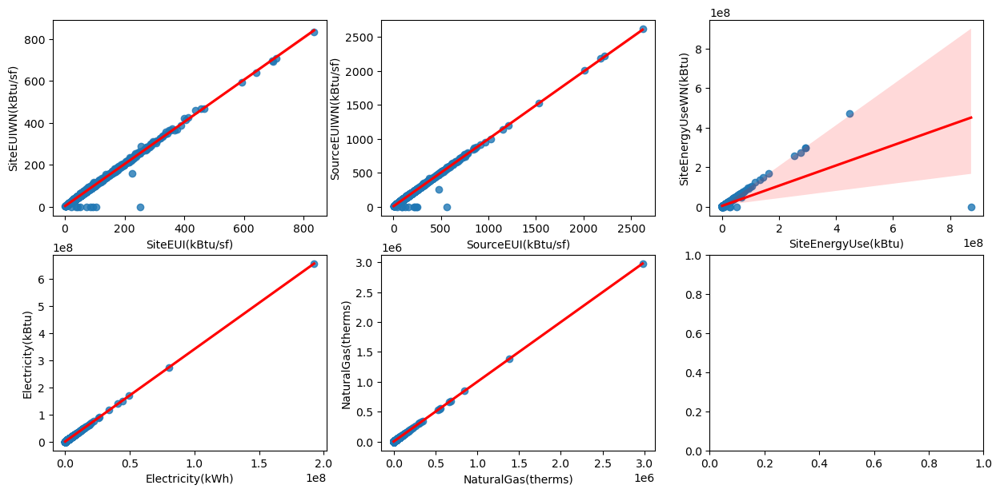

In [1017]:
# Colonnes pour l'analyse par paire
colonnes_x = ['SiteEUI(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SiteEnergyUse(kBtu)', 'Electricity(kWh)', 'NaturalGas(therms)']
colonnes_y = ['SiteEUIWN(kBtu/sf)', 'SourceEUIWN(kBtu/sf)', 'SiteEnergyUseWN(kBtu)', 'Electricity(kBtu)', 'NaturalGas(therms)']
zones_subplot = [231, 232, 233, 234, 235]  # Zones pour les sous-plots

# Création de la figure et des sous-plots
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(15, 7))

# Boucle sur chaque paire de colonnes
for x_col, y_col, subplot_zone in zip(colonnes_x, colonnes_y, zones_subplot):
    # Création du subplot correspondant
    plt.subplot(subplot_zone)
    
    # Tracé du nuage de points avec régression linéaire
    reg_plot = sns.regplot(data=data, x=x_col, y=y_col, line_kws={"color": "red"})
    
    # Calcul de la régression linéaire
    slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(
        x=reg_plot.get_lines()[0].get_xdata(),
        y=reg_plot.get_lines()[0].get_ydata()
    )
    
    # Affichage des coefficients de la régression
    print('Pour la colonne "{}" et la colonne "{}":'.format(x_col, y_col))
    print('    Coefficient Intercept :', round(intercept, 2))
    print('    Coefficient Slope :', round(slope, 2))
    print('    Coefficient R² :', round(r_value**2, 4))

# Affichage de la figure
plt.show()

- **On observe une corrélation cohérente entre les deux types de colonnes, bien que ces colonnes soient soit dans des unités différentes soit normalisées par des valeurs météorologiques.**
- **Cependant, des valeurs de 0 apparaissent pour les trois premiers groupes de variables. Ces valeurs n'ont pas leur place ici et sont probablement dues à une erreur de normalisation.**

In [1018]:
# Sélection des lignes où SiteEUIWN est égal à 0 mais SiteEUI est différent de 0 :
data.loc[(data['SiteEUIWN(kBtu/sf)'] == 0) & (data['SiteEUI(kBtu/sf)'] != 0), ['SiteEUIWN(kBtu/sf)', 'SiteEUI(kBtu/sf)']]

,SiteEUIWN(kBtu/sf),SiteEUI(kBtu/sf)
169,0.00,105.20
195,0.00,73.00
231,0.00,43.40
296,0.00,50.00
644,0.00,20.70
659,0.00,37.60
1486,0.00,93.80
1487,0.00,85.10
1488,0.00,252.00


- **Nous avons des valeurs non normalisées ainsi que des valeurs normalisées à 0. Nous devons trouver un moyen de corriger ces valeurs.**

In [1019]:
# Compléter les valeurs manquantes et les 0 des colonnes normalisées (WN) :

# Pour chaque paire de colonnes de consommation et colonnes normalisées :
for consommations, normalisee in zip(colonnes_x[:3], colonnes_y[:3]):

    # Remplacement des valeurs 0 par des NaN dans les colonnes normalisées
    # lorsque les valeurs de consommation sont différentes de 0.
    index_zero = data[(data[normalisee] == 0) & (data[consommations] != 0)].index
    for i in index_zero:
        data[normalisee].iloc[i] = np.nan

    # Prédiction des valeurs manquantes pour les colonnes normalisées
    # en utilisant la régression linéaire avec les valeurs de consommation.
    # Les données valides sont celles où la colonne normalisée n'est pas NaN.
    data_valides = data[data[normalisee].notna()]
    x_values = data_valides[consommations]
    y_values = data_valides[normalisee]
    model = np.polyfit(x_values, y_values, deg=1)  # Modèle de régression linéaire
    predict = np.poly1d(model)  # Fonction de prédiction

    # Pour les lignes où les valeurs normalisées sont NaN,
    # remplacer les NaN par les valeurs prédites à partir des valeurs de consommation.
    index_nan = data[data[normalisee].isna()].index
    for i in index_nan:
        data[normalisee].iloc[i] = predict(data.iloc[i][consommations])

- **Il semble improbable qu'un restaurant et un supermarché aient une consommation électrique de 0.**

In [1020]:
# Créer un DataFrame pour stocker les données initiales et les valeurs prédites
resultats_predictions = pd.DataFrame()

# Pour chaque paire de colonnes de consommation et de colonnes normalisées :
for consommations, normalisee in zip(colonnes_x[:3], colonnes_y[:3]):
    # Données initiales (consommation) et valeurs prédites (normalisée)
    data_valides = data[data[normalisee].notna()]
    valeurs_predict = predict(data_valides[consommations])
    
    # Créer un DataFrame temporaire avec les valeurs
    df_temp = pd.DataFrame({
        f'{consommations} (Initiales)': data_valides[consommations],
        f'{normalisee} (Prédites)': valeurs_predict
    })
    
    # Ajouter ce DataFrame temporaire aux résultats
    resultats_predictions = pd.concat([resultats_predictions, df_temp], axis=1)

# Afficher le DataFrame final
resultats_predictions

,SiteEUI(kBtu/sf) (Initiales),SiteEUIWN(kBtu/sf) (Prédites),SourceEUI(kBtu/sf) (Initiales),SourceEUIWN(kBtu/sf) (Prédites),SiteEnergyUse(kBtu) (Initiales),SiteEnergyUseWN(kBtu) (Prédites)
0,81.70,29732.88,182.50,29836.01,7226362.50,7423189.89
1,94.80,29746.28,176.10,29829.46,8387933.00,8611632.71
2,96.00,29747.51,241.90,29896.79,72587024.00,74295935.92
3,110.80,29762.65,216.20,29870.49,6794584.00,6981422.42
4,114.80,29766.75,211.40,29865.58,14172606.00,14530131.08
...,...,...,...,...,...,...
1515,51.00,29701.47,126.00,29778.20,932082.12,983294.64
1516,59.40,29710.06,114.20,29766.13,950276.19,1001909.62
1517,438.20,30097.63,744.80,30411.32,5765898.00,5928938.31
1518,51.00,29701.47,105.30,29757.03,719471.19,765765.06


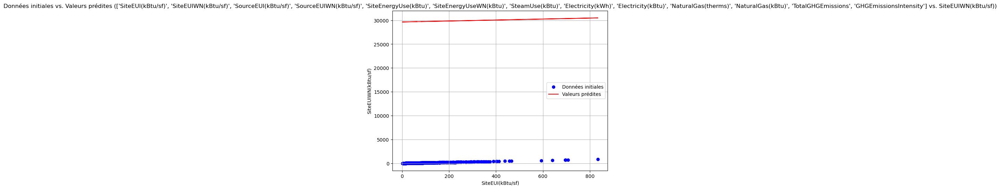

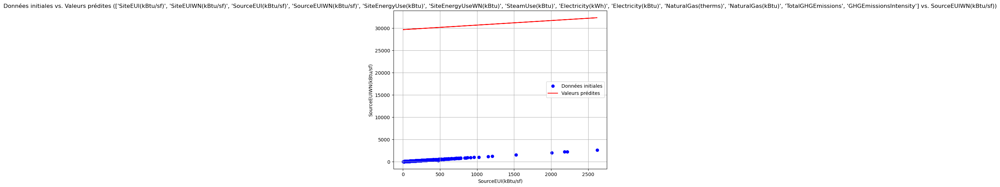

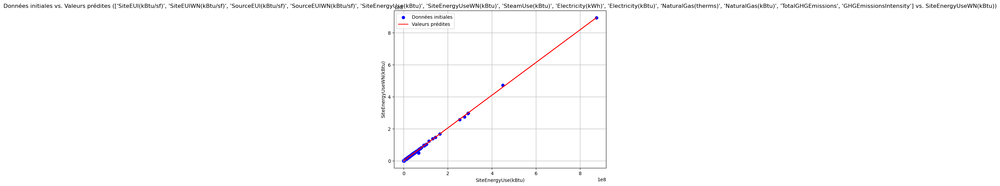

In [1021]:
# Pour chaque paire de colonnes de consommation et de colonnes normalisées :
for consommations, normalisee in zip(colonnes_x[:3], colonnes_y[:3]):
    # Créer un graphique pour visualiser les données initiales et les valeurs prédites
    plt.figure(figsize=(8, 6))

    # Données initiales (consommation en x, normalisée en y)
    plt.scatter(data[consommations], data[normalisee], color='blue', label='Données initiales')

    # Données prédites (consommation en x, prédites en y)
    data_valides = data[data[normalisee].notna()]
    plt.plot(data_valides[consommations], predict(data_valides[consommations]), color='red', label='Valeurs prédites')

    # Ajouter des titres et des légendes
    plt.xlabel(consommations)
    plt.ylabel(normalisee)
    plt.title(f'Données initiales vs. Valeurs prédites ({consommation} vs. {normalisee})')
    plt.legend()

    # Afficher le graphique
    plt.grid(True)
    plt.show()

In [1022]:
# Suppression des colonnes redondantes pour ne conserver que les colonnes dans la même unité :
data = data.drop(columns=['SiteEUI(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SiteEnergyUseWN(kBtu)', 
                          'Electricity(kWh)', 'NaturalGas(therms)'])

- **J'ai conservé les colonnes normalisées en utilisant les données météorologiques et les ai toutes converties dans la même unité.**

## colonnes de données énergétiques pour les normaliser par rapport à la surface

In [1023]:
# Etude du SteamUse :

# Obtient la valeur la plus fréquente de 'SteamUse(kBtu/sf)'
most_common_steam_use = data['SteamUse(kBtu)'].value_counts().head(1).values[0]           #.idxmax()
print(most_common_steam_use)

# Calcule le pourcentage de la valeur la plus fréquente parmi toutes les valeurs de 'SteamUse(kBtu/sf)'
# En utilisant normalize=True dans value_counts(), on obtient les fréquences relatives
# max() récupère la fréquence la plus élevée, qui est la fréquence de la valeur la plus fréquente
# En multipliant par 100, on obtient le pourcentage
print(round(data['SteamUse(kBtu)'].value_counts(normalize=True).max() * 100,2))

1409
92.7


- **1409 constructions ont une valeur de 0 pour cette variable, ce qui correspond à 92% de la DataFrame.**

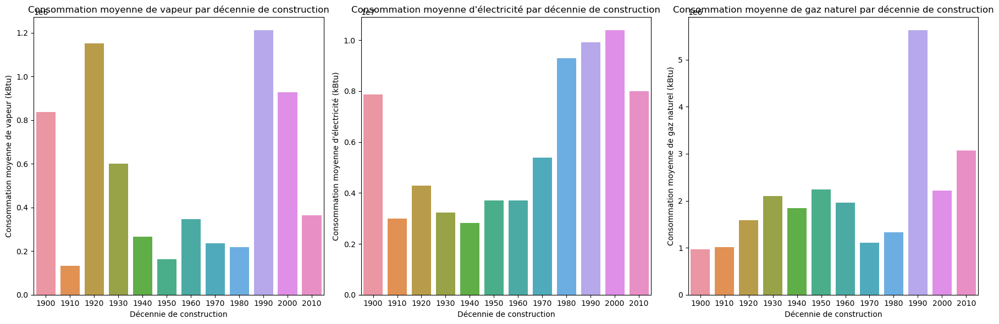

In [1024]:
# Calcul de la moyenne de la consommation de vapeur par décennie de construction
average_steam_by_year_built = data.groupby('YearBuiltDec')['SteamUse(kBtu)'].mean()

# Calcul de la moyenne de la consommation d'électricité par décennie de construction
average_electricity_by_year_built = data.groupby('YearBuiltDec')['Electricity(kBtu)'].mean()

# Calcul de la moyenne de la consommation de gaz naturel par décennie de construction
average_gas_by_year_built = data.groupby('YearBuiltDec')['NaturalGas(kBtu)'].mean()

# Création des sous-graphiques
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Graphique pour la consommation de vapeur
sns.barplot(x=average_steam_by_year_built.index, y=average_steam_by_year_built.values, ax=axes[0])
axes[0].set_xlabel('Décennie de construction')
axes[0].set_ylabel('Consommation moyenne de vapeur (kBtu)')
axes[0].set_title('Consommation moyenne de vapeur par décennie de construction')

# Graphique pour la consommation d'électricité
sns.barplot(x=average_electricity_by_year_built.index, y=average_electricity_by_year_built.values, ax=axes[1])
axes[1].set_xlabel('Décennie de construction')
axes[1].set_ylabel('Consommation moyenne d\'électricité (kBtu)')
axes[1].set_title('Consommation moyenne d\'électricité par décennie de construction')

# Graphique pour la consommation de gaz naturel
sns.barplot(x=average_gas_by_year_built.index, y=average_gas_by_year_built.values, ax=axes[2])
axes[2].set_xlabel('Décennie de construction')
axes[2].set_ylabel('Consommation moyenne de gaz naturel (kBtu)')
axes[2].set_title('Consommation moyenne de gaz naturel par décennie de construction')

# Ajuster l'espacement entre les sous-graphiques
plt.tight_layout()
plt.show()

- **Il y a eu une forte hausse dans les années 20, mais la tendance a été relativement stable depuis, à l'exception des années 1950.**


- **Nous observons une consommation d'électricité relativement élevée au cours des années 1900, suivie d'une utilisation stable au fil des années, à l'exception d'une augmentation notable entre 1980 et 2010.**


- **La consommation de gaz naturel a connu une tendance globalement stable avant 1980, à l'exception d'une augmentation marquée durant les années 1990.**

In [1025]:
# Etude des émissions GHG et de l'intensité :

# Sélection des types de propriétés avec une intensité d'émissions GHG de 0
properties_with_zero_intensity = data.loc[data['TotalGHGEmissions'] == 0, 'PrimaryPropertyType']
print(list(properties_with_zero_intensity))  # Affichage de cette liste

# Suppression de la colonne 'TotalGHGEmissions' du DataFrame
# 'TotalGHGEmissions' semble être une colonne qui n'est plus nécessaire
# Si elle est redondante ou n'est pas utile pour l'analyse, on peut la supprimer
data.drop(columns='GHGEmissionsIntensity', inplace=True)

[]


- **Après vérification, il s'avère que la colonne d'intensité correspond à la division des émissions par la surface totale des bâtiments de la construction.**


La colonne énergétique `GHGEmissionsIntensity` est calculée en divisant les émissions de gaz à effet de serre (GHG) par la surface totale des bâtiments de la construction. 

Mathématiquement, cela s'exprime par la formule :

**GHGEmissionsIntensity = GHGEmissions \ TotalGFA**

### Choix de la colonne cumulée

`Definitions :`

**Données cumulées :**
- **SiteEUI** (Intensity Energy Use Index) : L'intensité de consommation d'énergie du site est la consommation totale d'énergie d'une propriété, divisée par sa surface de plancher brute. La consommation d'énergie du site représente l'ensemble de l'énergie utilisée par la propriété sur place, telle qu'indiquée sur les factures des services publics. L'Intensity Energy Use Index du site est mesurée en milliers d'unités thermiques britanniques (kBtu) par pied carré.
  
- **SourceEUI** (Source Energy Use Index) : L'intensité de consommation d'énergie à la source est la consommation totale d'énergie à la source d'une propriété, divisée par sa surface de plancher brute. La consommation d'énergie à la source englobe toute l'énergie utilisée pour faire fonctionner la propriété, y compris les pertes de production, de transmission et de distribution. Le Source Energy Use Index est mesuré en milliers d'unités thermiques britanniques (kBtu) par pied carré.
  
- **SiteEnergyEUI** : Il s'agit de la quantité totale d'énergie consommée annuellement par la propriété, provenant de toutes les sources d'énergie disponibles.

**Données de consommation :**
- **SteamUse(kBtu)** : La quantité annuelle de vapeur de quartier consommée par la propriété sur place, mesurée en milliers d'unités thermiques britanniques (kBtu).
  
- **Electricity(kBtu)** : La quantité annuelle d'électricité consommée par la propriété sur place, incluant à la fois l'électricité achetée sur le réseau et celle générée par des systèmes renouvelables sur place, mesurée en kWh.
  
- **NaturalGas(kBtu)** : La quantité annuelle de gaz naturel fourni par les services publics consommée par la propriété, mesurée en milliers d'unités thermiques britanniques (kBtu).
  
- **GHGEmissionsIntensity** : Les émissions totales de gaz à effet de serre sont divisées par la surface de plancher brute de la propriété, mesurée en kilogrammes d'équivalent en dioxyde de carbone par pied carré. Ce calcul utilise un facteur d'émissions de GES provenant du portefeuille de ressources de production de Seattle City Light.

Ces définitions clarifient les différentes mesures utilisées pour évaluer l'utilisation et la consommation d'énergie, ainsi que les émissions de gaz à effet de serre pour les propriétés.

In [1026]:
# Sélection des colonnes spécifiques dans le DataFrame 'data'
# On choisit les colonnes 'SiteEUIWN(kBtu/sf)', 'SourceEUIWN(kBtu/sf)', 'SiteEnergyUseWN(kBtu/sf)'
# Ces colonnes représentent respectivement l'Intensity Energy Use Index du site pondéré, 
# l'Intensity Source Energy Use Index pondéré, et la consommation d'énergie du site pondérée.
selected_columns = data[['SiteEUIWN(kBtu/sf)', 'SourceEUIWN(kBtu/sf)', 'SiteEnergyUse(kBtu)']]
selected_columns

,SiteEUIWN(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu)
0,84.30,189.00,7226362.50
1,97.90,179.40,8387933.00
2,97.70,244.10,72587024.00
3,113.30,224.00,6794584.00
4,118.70,215.60,14172606.00
...,...,...,...
1515,56.20,136.60,932082.12
1516,65.90,118.90,950276.19
1517,460.10,767.80,5765898.00
1518,55.50,110.80,719471.19


- **La première colonne est redondante, car en divisant la consommation d'énergie du site par la surface, nous obtenons exactement l'Intensity Energy Use Index (SiteEUI).**

In [1027]:
# Suppression des colonnes inutiles :
columns_to_drop = ['SourceEUIWN(kBtu/sf)']  # 'SiteEnergyUse(kBtu/sf)',
data.drop(columns=columns_to_drop, axis=1, inplace=True)

##  Analyse des outliers

In [1028]:
data.head()

,BuildingType,PrimaryPropertyType,CouncilDistrictCode,Neighborhood,YearBuiltDec,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions
0,NonResidential,Hotel,7,DOWNTOWN,1920,1927,1,12,88434,0,88434,Hotel,88434.00,NaN,NaN,NaN,NaN,60.00,84.30,7226362.50,2003882.00,3946027.00,1276453.00,249.98
1,NonResidential,Hotel,7,DOWNTOWN,1990,1996,1,11,103566,15064,88502,Hotel,83880.00,Parking,15064.00,Restaurant,4622.00,61.00,97.90,8387933.00,0.00,3242851.00,5145082.00,295.86
2,NonResidential,Hotel,7,DOWNTOWN,1960,1969,1,41,956110,196718,759392,Hotel,756493.00,NaN,NaN,NaN,NaN,43.00,97.70,72587024.00,21566554.00,49526664.00,1493800.00,2089.28
3,NonResidential,Hotel,7,DOWNTOWN,1920,1926,1,10,61320,0,61320,Hotel,61320.00,NaN,NaN,NaN,NaN,56.00,113.30,6794584.00,2214446.25,2768924.00,1811213.00,286.43
4,NonResidential,Hotel,7,DOWNTOWN,1980,1980,1,18,175580,62000,113580,Hotel,123445.00,Parking,68009.00,Swimming Pool,0.00,75.00,118.70,14172606.00,0.00,5368607.00,8803998.00,505.01


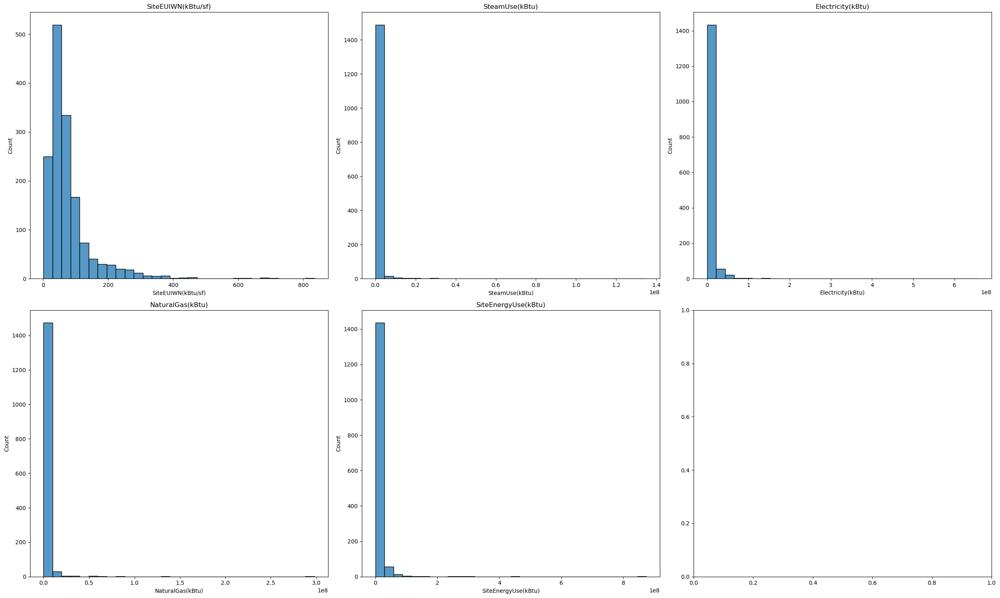

In [1029]:
# Etude des outliers :
# Liste des variables à étudier
Consommation = ['SiteEUIWN(kBtu/sf)', 'SteamUse(kBtu)', 'Electricity(kBtu)', 'NaturalGas(kBtu)', 
                'SiteEnergyUse(kBtu)', 'TotalGHGEmissions']
# Zones pour les sous-graphiques
zone = [231, 232, 233, 234, 235]

# Création de la figure et des sous-graphiques
fig, axs = plt.subplots(figsize=(25, 15), ncols=3, nrows=2)

# Itération à travers chaque variable et sa zone associée
for Variable, Z, ax in zip(Consommation, zone, axs.flatten()):
    # Création d'un histogramme pour chaque variable
    sns.histplot(data[Variable], bins=30, ax=ax)
    
    # Ajout d'un titre à chaque sous-graphique pour indiquer la variable
    ax.set_title(Variable)

# Ajustement automatique de la disposition des sous-graphiques
plt.tight_layout()

# Affichage de la figure
plt.show()

In [1030]:
# Eliminantion des outliers dans les targets :
Targets = ['SiteEnergyUse(kBtu)', 'TotalGHGEmissions']

In [1031]:
def find_outliers_IQR(df_column, alpha):
    """
    Trouve les outliers dans une colonne d'un DataFrame en utilisant la méthode de l'IQR.
    
    Parameters:
        df_column (pandas.Series): Colonne du DataFrame.
        alpha (float): Facteur multiplicatif pour définir la limite supérieure des outliers.
    
    Returns:
        list: Liste des indices des outliers.
    """
    q1 = df_column.quantile(0.25)
    q3 = df_column.quantile(0.75)
    IQR = q3 - q1
    outliers = df_column[df_column > (q3 + alpha * IQR)]

    return outliers.index


def find_all_outliers(df, column):
    """
    Trouve tous les outliers pour une colonne donnée en ajustant le facteur alpha.
    
    Parameters:
        df (pandas.DataFrame): DataFrame contenant les données.
        column (str): Nom de la colonne pour laquelle les outliers doivent être trouvés.
    
    Returns:
        list: Liste des indices de tous les outliers pour la colonne donnée.
    """
    good_alpha = 0
    new_good_alpha = -1
    alpha = 0
    nb_steps = 0
    outliers = []

    for i in range(5, 100, 1):
        outliers_temp = find_outliers_IQR(df[column], i / 5)
        new_good_alpha = round(len(outliers_temp) / len(df) * 100, 1)
        
        # Vérifie si le bon alpha n'a pas changé
        if good_alpha != new_good_alpha:
            good_alpha = new_good_alpha
        else:
            nb_steps += 1
            # Si le bon alpha n'a pas changé pendant 2 étapes successives, on enregistre les outliers
            if nb_steps == 2:
                print(f"Outliers pour {column} à {alpha} alpha: {len(outliers_temp)}")
                for outlier in outliers_temp:
                    outliers.append(outlier)
    
    return list(set(outliers))

In [1032]:
# Liste des colonnes de consommation à étudier
consommation = ['SiteEnergyUse(kBtu)', 'TotalGHGEmissions']

for colonne in consommation:
    # Trouver les outliers pour la colonne actuelle
    outliers_indices = find_all_outliers(data,colonne)
    
    # Supprimer les lignes correspondant aux outliers trouvés
    data = data.drop(index=outliers_indices).reset_index(drop=True)

Outliers pour SiteEnergyUse(kBtu) à 0 alpha: 50
Outliers pour TotalGHGEmissions à 0 alpha: 18


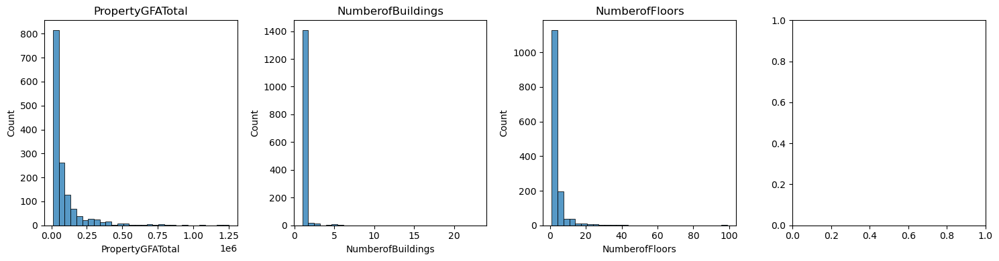

In [1033]:
# Etude des outliers :
# Liste des variables de consommation à étudier
consommation = ['PropertyGFATotal', 'NumberofBuildings', 'NumberofFloors']
# Zones pour les sous-graphiques
zone = [141, 142, 143, 144]

# Création de la figure et des sous-graphiques
fig, axs = plt.subplots(figsize=(15, 4), ncols=4, nrows=1)

# Itération à travers chaque variable et sa zone associée
for variable, z, ax in zip(consommation, zone, axs.flatten()):
    # Création d'un histogramme pour chaque variable
    sns.histplot(data[variable], bins=30, ax=ax)
    
    # Ajout d'un titre à chaque sous-graphique pour indiquer la variable
    ax.set_title(variable)

# Ajustement automatique de la disposition des sous-graphiques pour éviter le chevauchement
plt.tight_layout()

# Affichage de la figure
plt.show()

## Élimination des variables superflues et modification de certaines.

In [1034]:
# Analyse des surfaces des bâtiments 1, 2 et 3 par rapport au total :
# Calcul de la différence entre la surface totale et la somme des surfaces des bâtiments 1, 2 et 3
difference_surfaces = (data['PropertyGFATotal'] - data[['LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA',
                                         'ThirdLargestPropertyUseTypeGFA']].sum(axis=1))

# Sélection des lignes où la différence est négative (c'est-à-dire où la somme des surfaces des bâtiments dépasse la surface totale)
surfaces_negatives = difference_surfaces[difference_surfaces < 0].to_frame()
surfaces_negatives

,0
3,-15874.00
9,-3464.00
11,-37159.00
12,-400.00
13,-2987.00
...,...
1431,-6373.00
1432,-14632.20
1433,-2873.00
1437,-728.00


In [1035]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1452 entries, 0 to 1451
Data columns (total 24 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   BuildingType                     1452 non-null   object 
 1   PrimaryPropertyType              1452 non-null   object 
 2   CouncilDistrictCode              1452 non-null   int64  
 3   Neighborhood                     1452 non-null   object 
 4   YearBuiltDec                     1452 non-null   int64  
 5   YearBuilt                        1452 non-null   int64  
 6   NumberofBuildings                1452 non-null   int32  
 7   NumberofFloors                   1452 non-null   int64  
 8   PropertyGFATotal                 1452 non-null   int64  
 9   PropertyGFAParking               1452 non-null   int64  
 10  PropertyGFABuilding(s)           1452 non-null   int64  
 11  LargestPropertyUseType           1452 non-null   object 
 12  LargestPropertyUseTy

- **Il y a un problème avec les surfaces lorsqu'on les compare à la surface totale. 360 bâtiments présentent une surface cumulée des trois plus grands bâtiments supérieure à la surface totale.**

In [1036]:
# Colonne 'Parking'
# Création d'une nouvelle colonne 'Parking' en divisant la surface de stationnement par la surface totale de maison
data['Parking (%)'] = data['PropertyGFAParking'] / data['PropertyGFATotal']

- **La surface de toutes les piscines est de 0.**

In [1037]:
# Colonnes à supprimer
colonnes_a_supprimer = [
    'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
    'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
    'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
    'PropertyGFAParking'
]

# Suppression des colonnes
data.drop(columns=colonnes_a_supprimer, inplace=True)

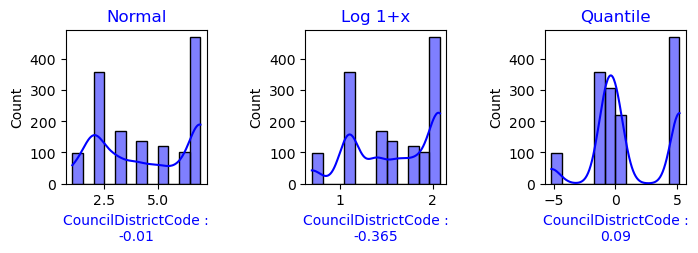

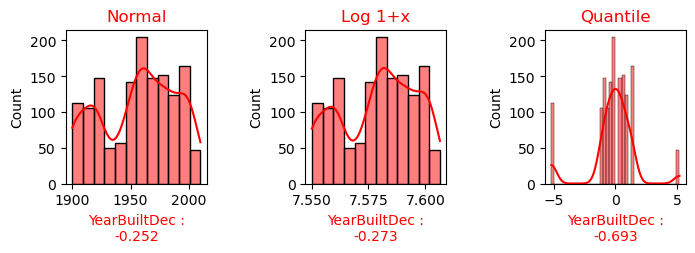

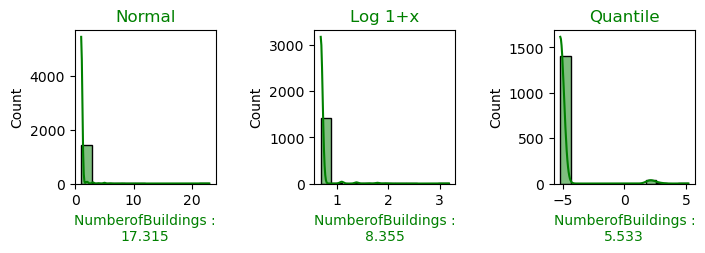

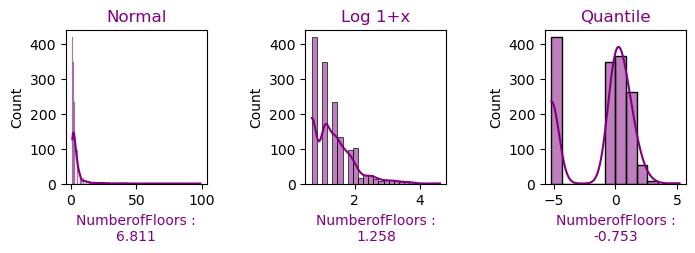

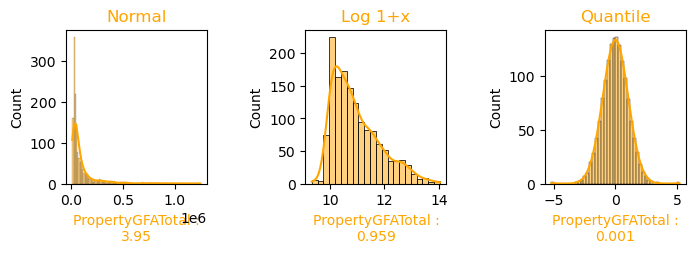

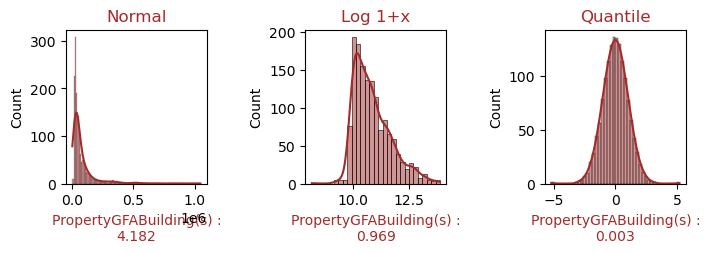

In [1038]:
from scipy.stats import skew
import colorama
from sklearn.preprocessing import QuantileTransformer

def plot_skewness(colonne, color):
    """
    Fonction pour tracer les trois graphiques pour étudier l'asymétrie d'une colonne donnée.
    
    Arguments :
        - colonne : nom de la colonne à étudier
        - color : couleur à utiliser pour les graphiques
    """
    # Création d'une figure avec 3 sous-graphiques
    fig, ax = plt.subplots(1, 3, figsize=(8, 2))
    
    # Graphique pour la distribution normale
    plt.subplot(131)
    sns.histplot(data[colonne], color=color, kde=True)
    plt.title('Normal', color=color)
    plt.xlabel(colonne + ' :' + "\n" + str(round(skew(data[colonne].to_list()), 3)), color=color)
    
    # Graphique pour la distribution Log 1+x
    plt.subplot(132)
    sns.histplot(np.log1p(data[colonne]), color=color, kde=True)
    plt.title('Log 1+x', color=color)
    plt.xlabel(colonne + ' :' + "\n" + str(round(skew(np.log1p(data[colonne]).to_list()), 3)), color=color)
    
    # Graphique pour la distribution Quantile
    plt.subplot(133)
    QT = pd.DataFrame(QuantileTransformer(output_distribution="normal").fit_transform(data[colonne].to_frame())).rename(columns={0: colonne})[colonne]
    sns.histplot(QT, color=color, kde=True)
    plt.title("Quantile", color=color)
    plt.xlabel(colonne + ' :' + "\n" + str(round(skew(QT.to_list()), 3)), color=color)
    
    # Ajustement des espaces entre les graphiques
    plt.subplots_adjust(wspace=0.7)
    plt.show()

# Colonnes à étudier
colonnes_etude = ['CouncilDistrictCode', 'YearBuiltDec', 'NumberofBuildings', 'NumberofFloors',
                  'PropertyGFATotal', 'PropertyGFABuilding(s)']

# Couleurs pour chaque colonne
couleurs = ['blue', 'red', 'green', 'purple', 'orange', 'brown']

# Itération sur chaque colonne et sa couleur respective
for colonne, couleur in zip(colonnes_etude, couleurs):
    plot_skewness(colonne, couleur)

In [1039]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1452 entries, 0 to 1451
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   BuildingType            1452 non-null   object 
 1   PrimaryPropertyType     1452 non-null   object 
 2   CouncilDistrictCode     1452 non-null   int64  
 3   Neighborhood            1452 non-null   object 
 4   YearBuiltDec            1452 non-null   int64  
 5   YearBuilt               1452 non-null   int64  
 6   NumberofBuildings       1452 non-null   int32  
 7   NumberofFloors          1452 non-null   int64  
 8   PropertyGFATotal        1452 non-null   int64  
 9   PropertyGFABuilding(s)  1452 non-null   int64  
 10  ENERGYSTARScore         937 non-null    float64
 11  SiteEUIWN(kBtu/sf)      1452 non-null   float64
 12  SiteEnergyUse(kBtu)     1452 non-null   float64
 13  SteamUse(kBtu)          1452 non-null   float64
 14  Electricity(kBtu)       1452 non-null   

## Analyse univariée des données de consommation.

In [1040]:
# Liste des variables de consommation
consommation = ['SiteEUIWN(kBtu/sf)', 'SteamUse(kBtu)', 'Electricity(kBtu)', 'NaturalGas(kBtu)', 
                'TotalGHGEmissions', 'SiteEnergyUse(kBtu)']

# Description statistique des variables de consommation
consommation = data[consommation].describe()
consommation

,SiteEUIWN(kBtu/sf),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,SiteEnergyUse(kBtu)
count,1452.00,1452.00,1452.00,1452.00,1452.00,1452.00
mean,73.36,144335.61,3825831.41,1208097.27,101.97,5198770.58
std,68.39,781523.22,5640023.65,1993019.54,136.87,6670253.44
min,1.50,0.00,3.00,0.00,0.40,57133.20
25%,36.60,0.00,715944.00,0.00,19.72,1208033.84
50%,55.50,0.00,1580550.50,444521.00,46.59,2502106.00
75%,85.30,0.00,4431234.00,1371881.00,124.45,6358533.12
max,834.40,9763690.00,41680634.00,14061838.00,809.76,41680640.00


## Analyse Multivariée

### Réorganiser les colonnes pour l'analyse.

### Analyse de la corrélation entre certaines variables.

In [1041]:
# Liste des variables à analyser
variables = ['YearBuilt', 'PropertyGFATotal', 'NumberofBuildings', 'NumberofFloors', 'ENERGYSTARScore', 
             'SiteEUIWN(kBtu/sf)', 'SteamUse(kBtu)', 'Electricity(kBtu)', 'NaturalGas(kBtu)', 
             'TotalGHGEmissions', 'SiteEnergyUse(kBtu)', 'Parking (%)']

In [1042]:
# Liste des colonnes à considérer
columns_of_interest = ['YearBuilt', 'ENERGYSTARScore', 'NumberofBuildings', 'NumberofFloors']

# Initialiser un DataFrame vide pour stocker les résultats de corrélation
Corr = pd.DataFrame()

# Boucle à travers les colonnes d'intérêt
for column in columns_of_interest:
    # Calcul de la corrélation et création du DataFrame
    correlation = data.corr()[column].sort_values(ascending=False).to_frame().reset_index()
    correlation = correlation.rename(columns={'index': f'Vs{column}', column: 'Correlation'})
    
    # Ajout à notre DataFrame principal en fusionnant
    if Corr.empty:
        Corr = correlation
    else:
        Corr = pd.merge(Corr, correlation, left_index=True, right_index=True)

Corr.head(7)

,VsYearBuilt,Correlation_x,VsENERGYSTARScore,Correlation_y,VsNumberofBuildings,Correlation_x,VsNumberofFloors,Correlation_y
0,YearBuilt,1.00,ENERGYSTARScore,1.00,NumberofBuildings,1.00,NumberofFloors,1.00
1,YearBuiltDec,1.00,PropertyGFABuilding(s),0.20,SiteEnergyUse(kBtu),0.17,PropertyGFATotal,0.62
2,Parking (%),0.35,PropertyGFATotal,0.20,TotalGHGEmissions,0.15,PropertyGFABuilding(s),0.60
3,Electricity(kBtu),0.26,NumberofFloors,0.15,Electricity(kBtu),0.15,Electricity(kBtu),0.54
4,PropertyGFATotal,0.25,CouncilDistrictCode,0.14,NaturalGas(kBtu),0.14,SiteEnergyUse(kBtu),0.50
5,SiteEnergyUse(kBtu),0.25,Parking (%),0.02,PropertyGFABuilding(s),0.11,TotalGHGEmissions,0.30
6,PropertyGFABuilding(s),0.19,SteamUse(kBtu),0.01,PropertyGFATotal,0.09,CouncilDistrictCode,0.29


- **Les variables Year, ENERGYSTARS et le Nombre de Bâtiments ne montrent pas de corrélation significative avec les autres variables.**
- **Le Nombre d'Étages est corrélé à la superficie totale des bâtiments et des parkings, ce qui est attendu. Cependant, il n'y a pas de corrélation avec la quantité d'énergie consommée.**
- **Il y a une légère corrélation entre le Nombre d'Étages et le Code District, ce qui est cohérent avec la carte montrant que les bâtiments se trouvent principalement au centre-ville. De même pour la corrélation avec le Quartier.**

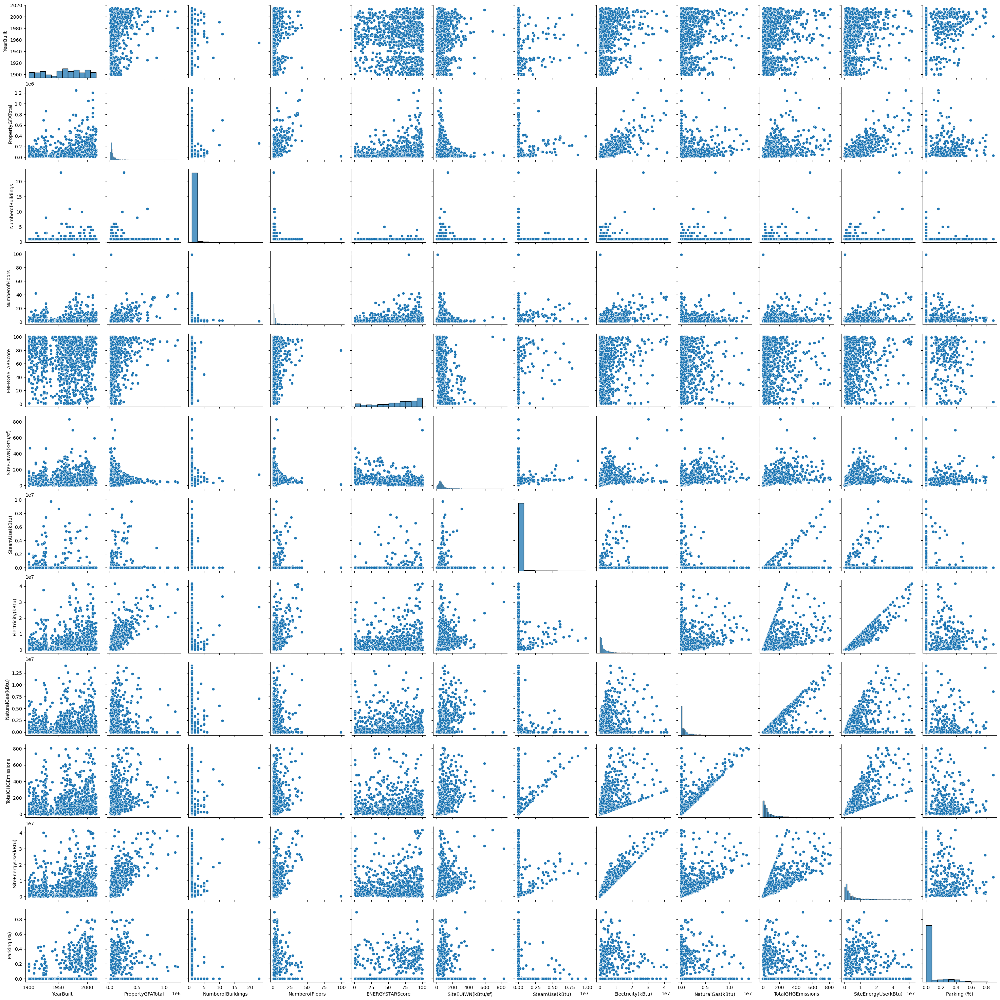

In [1043]:
# Pairplot pour visualiser la relation entre les variables numériques
sns.pairplot(data[variables])
plt.show()

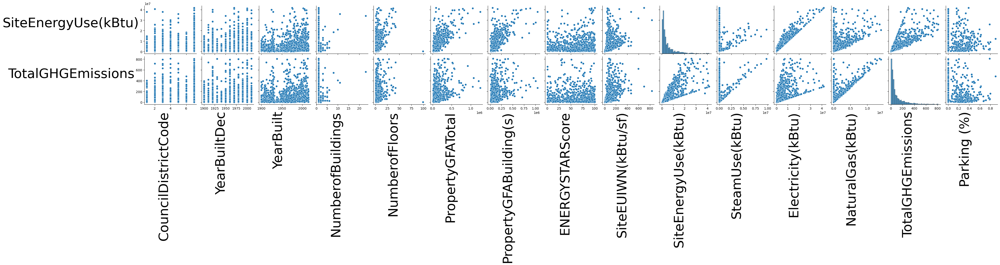

In [1044]:
# Pairplot avec des propriétés modifiées pour les étiquettes
g = sns.pairplot(data, y_vars=['SiteEnergyUse(kBtu)', 'TotalGHGEmissions'])

# Modification des étiquettes sur les axes
for ax in g.axes.flat:
    ax.set(ylabel=ax.get_ylabel(), xlabel=ax.get_xlabel())
    ax.set_ylabel(ax.get_ylabel(), rotation=0, horizontalalignment='right', size=40)
    ax.set_xlabel(ax.get_xlabel(), rotation=90, horizontalalignment='right', size=40)

plt.show()

- **Les variables les plus fortement corrélées avec les deux cibles sont celles liées à la consommation d'énergie.**

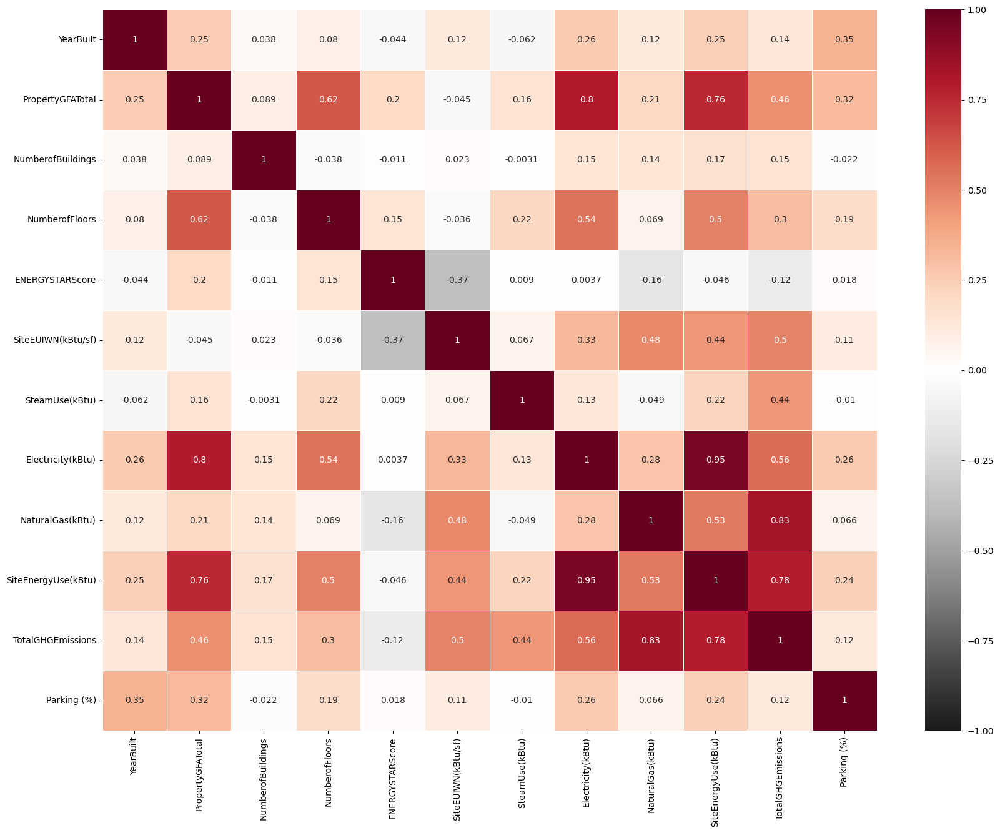

In [1045]:
# Créer une heatmap de corrélation :

# Définir les variables à utiliser dans la heatmap
Variables = ['YearBuilt', 'PropertyGFATotal', 'NumberofBuildings', 'NumberofFloors', 'ENERGYSTARScore', 
             'SiteEUIWN(kBtu/sf)', 'SteamUse(kBtu)', 'Electricity(kBtu)', 'NaturalGas(kBtu)', 
             'SiteEnergyUse(kBtu)', 'TotalGHGEmissions', 'Parking (%)']

# Définir la taille de la figure
plt.figure(figsize=(20, 15))

# Calculer la matrice de corrélation pour les variables spécifiées dans Data
correlation_matrix = data[Variables].corr()

# Créer la heatmap avec la matrice de corrélation
heatmap = sns.heatmap(correlation_matrix, 
                      vmin=-1,        # Valeur minimale pour la couleur
                      vmax=1,         # Valeur maximale pour la couleur
                      linewidth=0.5,  # Épaisseur des lignes entre les cases
                      annot=True,     # Afficher les valeurs dans les cases
                      cmap="RdGy_r")  # Palette de couleurs

# Afficher la heatmap
plt.show()

- **Les variables de surfaces totales, de surfaces de parkings et de surfaces de bâtiments sont uniquement corrélées entre elles, ce qui est logique car les autres variables sont normalisées par la surface.**

- **Le ENERGY STAR Score n'est corrélé à aucune autre variable.**

- **Le Steam Use montre une faible corrélation potentielle.**

- **Les autres variables présentent des niveaux de corrélation variables entre elles.**

**SiteEUIWN(kBtu/sf)** désigne l'Intensité d'Utilisation de l'Énergie du site, normalisée en fonction des conditions météorologiques (Weather Normalized Site Energy Use Intensity), mesurée en kilo-British thermal units par pied carré (kBtu/sf). Cette mesure représente la consommation d'énergie par unité de surface du site, ajustée pour tenir compte des variations climatiques, permettant une comparaison équitable de l'efficacité énergétique entre différents sites ou bâtiments, indépendamment des conditions météorologiques.

La variable consommation **SiteEnergyUse(kBtu)** fait référence la consommation totale d'énergie d'un site, mesurée en kilo-British thermal units (kBtu). Cela inclut toutes les formes d'énergie utilisées sur le site, telles que l'électricité, le gaz naturel, la vapeur, et autres, converties en une unité commune, le kBtu. Cette mesure permet d'évaluer et de comparer l'efficacité énergétique de différents sites ou bâtiments.

La variable consommation **TotalGHGEmissions** désigne les émissions totales de gaz à effet de serre (GES) d'un site, mesurées en termes de dioxyde de carbone équivalent (CO2e). Cela inclut tous les types de GES produits par les activités du site, tels que le dioxyde de carbone (CO2), le méthane (CH4), et le protoxyde d'azote (N2O), parmi d'autres. La mesure en CO2e permet de comparer et d'évaluer l'impact environnemental des émissions de GES en utilisant une unité standardisée.

La variable **SteamUse(kBtu/sf)** représente la consommation de vapeur (Steam Use en anglais) d'un bâtiment, mesurée en termes d'Energy Use Intensity (EUI) ou Intensité de Consommation Énergétique en anglais.

**ENERGYSTARScore** est une évaluation comparative de l'efficacité énergétique d'un bâtiment, notée sur une échelle de 1 à 100. Cette évaluation est fournie par le programme ENERGY STAR de l'Environmental Protection Agency (EPA) des États-Unis. Un score de 50 indique que le bâtiment a une performance énergétique médiane par rapport à des bâtiments similaires. Un score de 75 ou plus indique que le bâtiment se situe dans les 25% les plus performants et peut être éligible à la certification ENERGY STAR, signalant une efficacité énergétique supérieure.

## Cercle des corrélations

## ACP, ou notre PCA !

In [1046]:
# Suppression des colonnes inutiles :
columns_to_drop = ['CouncilDistrictCode', 'Neighborhood']
data.drop(columns=columns_to_drop, axis=1, inplace=True)

### Label encoding

In [1047]:
data.head()

,BuildingType,PrimaryPropertyType,YearBuiltDec,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFABuilding(s),ENERGYSTARScore,SiteEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,Parking (%)
0,NonResidential,Hotel,1920,1927,1,12,88434,88434,60.00,84.30,7226362.50,2003882.00,3946027.00,1276453.00,249.98,0.00
1,NonResidential,Hotel,1990,1996,1,11,103566,88502,61.00,97.90,8387933.00,0.00,3242851.00,5145082.00,295.86,0.15
2,NonResidential,Hotel,1920,1926,1,10,61320,61320,56.00,113.30,6794584.00,2214446.25,2768924.00,1811213.00,286.43,0.00
3,NonResidential,Hotel,1980,1980,1,18,175580,113580,75.00,118.70,14172606.00,0.00,5368607.00,8803998.00,505.01,0.35
4,Nonresidential COS,Other,1990,1999,1,2,97288,60090,NaN,141.60,12086616.00,0.00,7371434.00,4715182.00,301.81,0.38


In [1048]:
# Création de X en sélectionnant les colonnes pertinentes
X = data[["YearBuilt","PropertyGFATotal", "NumberofBuildings", "NumberofFloors", 
          "SteamUse(kBtu)", "Electricity(kBtu)", "NaturalGas(kBtu)"]]           # ENERGYSTARScore

# Création de y à partir de la colonne "SiteEUIWN(kBtu/sf)
y = data["SiteEnergyUse(kBtu)"]

In [1049]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# Normalisation des données avec MinMaxScaler
scaler_minmax = MinMaxScaler()
X_normalized = scaler_minmax.fit_transform(X)

# Standardisation des données normalisées
scaler_standard = StandardScaler()
X_scaled = scaler_standard.fit_transform(X_normalized)

# Affichage de la forme de X_scaled
print(X_scaled.shape)

(1452, 7)


In [1050]:
# On espère avoir une moyenne à 0 et un écart type à 1 :

idx = ["mean", "std"]

pd.DataFrame(X_scaled).describe().round(2).loc[idx, :] 

,0,1,2,3,4,5,6
mean,-0.00,0.00,-0.00,0.00,0.00,-0.00,0.00
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00


### PCA

In [1051]:
from sklearn.decomposition import PCA

# Nous allons travailler que sur les 6 premières composantes :
n_components = 6

# Initialisation de l'objet PCA avec les 6 premières composantes spécifiée
pca = PCA(n_components = n_components)

# Réduction de dimensionnalité et transformation des données (On l'entraine)
X_pca = pca.fit_transform(X_scaled)

# Dimensions du nouveau jeu de données après PCA
X_pca.shape

(1452, 6)

Intéressons nous maintenant à la variance captée par chaque nouvelle composante. Grace à scikit-learn on peut utiliser l'attribut explained_variance_ratio_ :

In [1052]:
pca.explained_variance_ratio_

array([0.362521  , 0.17540119, 0.14287143, 0.12020741, 0.11165004,
       0.05974798])

- **Ici la 1ère composante capte 25% de la variance de nos données initiales, la 2ème 19% etc etc.**

- **La 5éme et la 6ème ne sont pas vraiment utile.**

In [1053]:
# Enregistrons cela dans une variable :

scree = (pca.explained_variance_ratio_*100).round(2)
scree

array([36.25, 17.54, 14.29, 12.02, 11.17,  5.97])

Les 2 premières composantes captent donc 25+19 = 44% de la variance, les 3 premières 25+19+15 = 59% de la variance etc etc.

Dans le jargon, cela s'appelle une somme cumulée. Et pour faire une somme cumulée numpy dispose de la fonction cumsum :

In [1054]:
scree_cum = scree.cumsum().round()
scree_cum

array([36., 54., 68., 80., 91., 97.])

In [1055]:
# Définisons ensuite une variable avec la liste de nos composantes :

x_list = range(1, n_components+1)
list(x_list)

[1, 2, 3, 4, 5, 6]

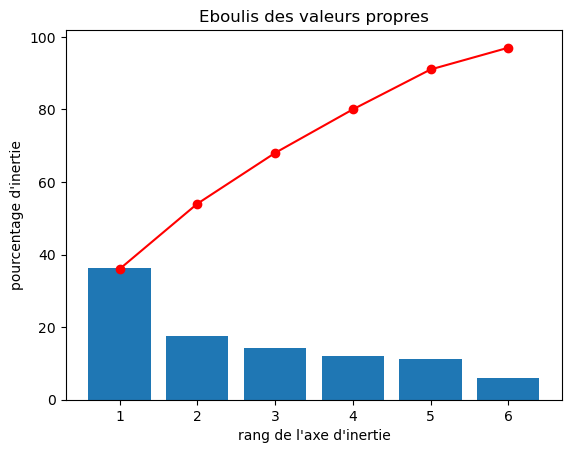

In [1056]:
# On peut enfin l'afficher de façon graphique :

plt.bar(x_list, scree)
plt.plot(x_list, scree_cum,c="red",marker='o')
plt.xlabel("rang de l'axe d'inertie")
plt.ylabel("pourcentage d'inertie")
plt.title("Eboulis des valeurs propres")
plt.show(block=False)

- **On a en bleu la variance de chaque nouvelle composante, et en rouge la variance cumulée.**

- **On voit ici que près de 80% de la variance est comprise dans les 3 premières composantes, et près de 90% dans les 4 premières.**

- **L'éboulis suggère qu'il est pertinent de conserver les deux premiers plans.**

### Intéressons nous maintenant à nos fameuses composantes.

- **La formule de calcul de composantes nous est donnée par l'attribut components_. Cette variable est généralement nommée pcs :**

In [1057]:
# Création d'un DataFrame à partir des composantes principales (pcs)
# Les colonnes du DataFrame seront les colonnes de X
# Les index seront nommés "F{i}" où i est un élément de x_list
# Les valeurs seront arrondies à 2 décimales

features = X.columns
pcs = pd.DataFrame(
    pca.components_,           # Les composantes principales de l'analyse PCA
    columns=features,          # Les noms des colonnes sont ceux de X
    index=[f"F{i}" for i in x_list]  # Index nommés F1, F2, F3, etc. en fonction de x_list
).round(2)                      # Arrondir les valeurs à 2 décimales

De mieux en mieux !

"ATTENTION" : Nous avons arrondi les résultats pour simplifier l'analyse

- **Dans certains cas, on voudra afficher ce dataframe comme cela :**

In [1058]:
pcs.T

,F1,F2,F3,F4,F5,F6
YearBuilt,0.23,0.37,-0.52,0.60,-0.37,0.20
PropertyGFATotal,0.57,-0.05,-0.06,-0.02,0.17,-0.32
NumberofBuildings,0.10,0.45,0.71,0.42,0.29,0.16
NumberofFloors,0.47,-0.33,-0.05,-0.12,0.24,0.76
SteamUse(kBtu),0.16,-0.54,0.44,0.27,-0.64,-0.06
Electricity(kBtu),0.56,0.05,-0.01,-0.03,0.11,-0.47
NaturalGas(kBtu),0.22,0.50,0.18,-0.61,-0.51,0.17


- **Et pour une représentation plus visuelle, comme cela :**

<AxesSubplot:>

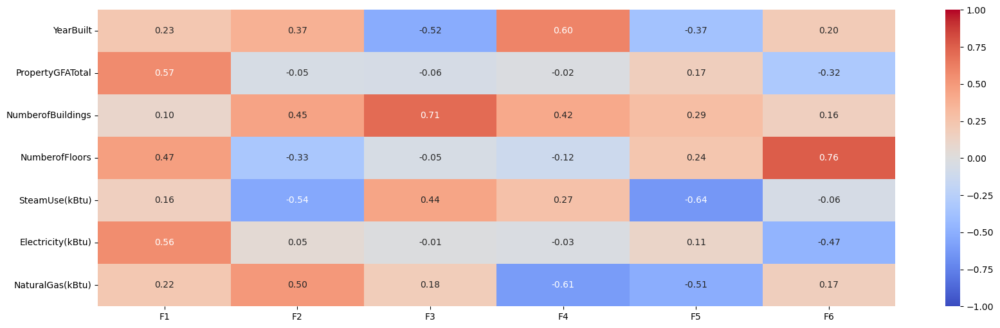

In [1059]:
fig, ax = plt.subplots(figsize=(20, 6))
sns.heatmap(pcs.T, vmin=-1, vmax=1, annot=True, cmap="coolwarm", fmt="0.2f")

### Graphique de Correlation

- **Définissons nos axes x et y. Nous allons utiliser les 2 premières composantes. Comme - en code - on commence à compter à partir de 0, cela nous donne :**

In [1060]:
x, y = 0,1

Pour la partie graphique :

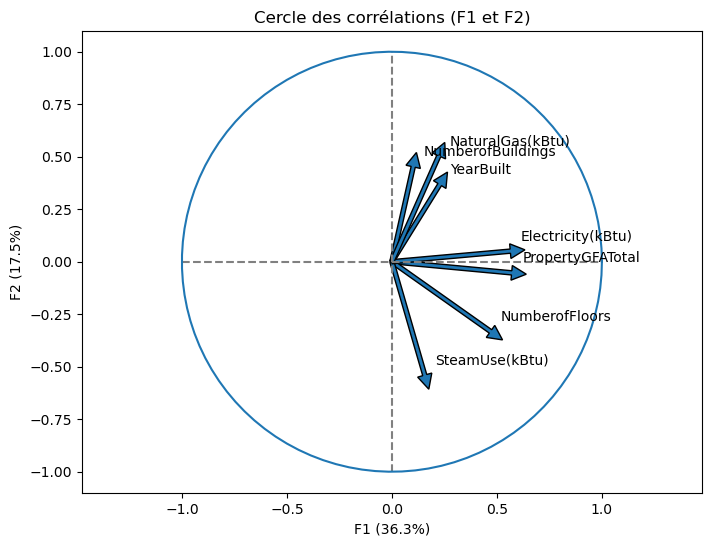

In [1061]:
fig, ax = plt.subplots(figsize=(8, 6))
for i in range(0, pca.components_.shape[1]):
    ax.arrow(0,
             0,  # Start the arrow at the origin
             pca.components_[0, i],  #0 for PC1
             pca.components_[1, i],  #1 for PC2
             head_width=0.07,
             head_length=0.07, 
             width=0.02,              )

    plt.text(pca.components_[0, i] + 0.05,
             pca.components_[1, i] + 0.05,
             features[i])
    
# affichage des lignes horizontales et verticales
plt.plot([-1, 1], [0, 0], color='grey', ls='--')
plt.plot([0, 0], [-1, 1], color='grey', ls='--')


# nom des axes, avec le pourcentage d'inertie expliqué
plt.xlabel('F{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
plt.ylabel('F{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

plt.title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))


an = np.linspace(0, 2 * np.pi, 100)
plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale
plt.axis('equal')
plt.show(block=False)

## Prédiction des tests sur les variables de consommation.

### Label encoding

Pourquoi utiliser le label encoding n’est pas une très bonne chose? 

Tout d’abord, car comme son nom l’indique le **LabelEncoder** est plutôt pensé pour encoder la target (les labels). Concernant les features, on peut utiliser, par exemple, un **OrdinalEncoder**. Mais aussi et surtout car il faut nous poser une question : Existe-t-il un “ordre” dans nos données.

En effet, transformer A, B, C en 1, 2, 3 n'est possible que si A > B > C, autrement dit, si la variable est bien “ordinale”. Si tel n’est pas le cas, il vaut mieux utiliser des transformations telles que le **OneHotEncoding**.

- **Attention avec ce type de manipulation**

In [1062]:
data.head()

,BuildingType,PrimaryPropertyType,YearBuiltDec,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFABuilding(s),ENERGYSTARScore,SiteEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,Parking (%)
0,NonResidential,Hotel,1920,1927,1,12,88434,88434,60.00,84.30,7226362.50,2003882.00,3946027.00,1276453.00,249.98,0.00
1,NonResidential,Hotel,1990,1996,1,11,103566,88502,61.00,97.90,8387933.00,0.00,3242851.00,5145082.00,295.86,0.15
2,NonResidential,Hotel,1920,1926,1,10,61320,61320,56.00,113.30,6794584.00,2214446.25,2768924.00,1811213.00,286.43,0.00
3,NonResidential,Hotel,1980,1980,1,18,175580,113580,75.00,118.70,14172606.00,0.00,5368607.00,8803998.00,505.01,0.35
4,Nonresidential COS,Other,1990,1999,1,2,97288,60090,NaN,141.60,12086616.00,0.00,7371434.00,4715182.00,301.81,0.38


In [1063]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1452 entries, 0 to 1451
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   BuildingType            1452 non-null   object 
 1   PrimaryPropertyType     1452 non-null   object 
 2   YearBuiltDec            1452 non-null   int64  
 3   YearBuilt               1452 non-null   int64  
 4   NumberofBuildings       1452 non-null   int32  
 5   NumberofFloors          1452 non-null   int64  
 6   PropertyGFATotal        1452 non-null   int64  
 7   PropertyGFABuilding(s)  1452 non-null   int64  
 8   ENERGYSTARScore         937 non-null    float64
 9   SiteEUIWN(kBtu/sf)      1452 non-null   float64
 10  SiteEnergyUse(kBtu)     1452 non-null   float64
 11  SteamUse(kBtu)          1452 non-null   float64
 12  Electricity(kBtu)       1452 non-null   float64
 13  NaturalGas(kBtu)        1452 non-null   float64
 14  TotalGHGEmissions       1452 non-null   

In [1064]:
# Définir une fonction pour transformer les valeurs en variables binaires
def transform_to_binary(value):
    if value > 0:
        return 1  # Si la valeur est strictement supérieure à 0, renvoyer 1 (consommation d'énergie)
    else:
        return 0  # Sinon, renvoyer 0 (pas de consommation d'énergie)

# Appliquer la fonction à chaque valeur de chaque colonne
data['SteamUse_binary'] = data['SteamUse(kBtu)'].apply(transform_to_binary)
data['Electricity_binary'] = data['Electricity(kBtu)'].apply(transform_to_binary)
data['NaturalGas_binary'] = data['NaturalGas(kBtu)'].apply(transform_to_binary)

In [1065]:
# Colonne 'PropertyGFABuildingType (%)'
data['PropertyGFABuilding (%)'] = data['PropertyGFABuilding(s)'] / data['PropertyGFATotal']

In [1066]:
# Suppression de colonne inutile :
columns_to_drop_ = ['PropertyGFABuilding(s)']
data.drop(columns=columns_to_drop_, axis=1, inplace=True)

In [1067]:
data["BuildingType"].unique()

array(['NonResidential', 'Nonresidential COS', 'SPS-District K-12',
       'Campus', 'Nonresidential WA'], dtype=object)

In [1068]:
data["PrimaryPropertyType"].unique()

array(['Hotel', 'Other', 'Mixed Use Property', 'University',
       'Small- and Mid-Sized Office', 'Self-Storage Facility',
       'K-12 School', 'Large Office', 'Senior Care Community',
       'Medical Office', 'Retail Store', 'Warehouse',
       'Distribution Center', 'Worship Facility',
       'Supermarket / Grocery Store', 'Laboratory',
       'Refrigerated Warehouse', 'Restaurant', 'Hospital'], dtype=object)

### Transformation de la variable BuildingType

Dans la pratique, remplacer les catégories par une valeur croissante ne m'a jamais vraiment posé de problème. Je n'ai jamais remarqué une dégradation importante des scores du modèle. Toutefois il y a une méthode propre pour numériser des catégories non ordonnées appelée one hot encoding.

In [1069]:
# enlevons les echantillons pour lesquelsBuildingType manque
#data = data[~data.BuildingType.isna()].copy()
#data.reset_index(drop = True, inplace = True)

In [1070]:
from sklearn import preprocessing
enc = preprocessing.OneHotEncoder()
labels = enc.fit_transform(data.BuildingType.values.reshape(-1, 1)).toarray()
labels.shape

(1452, 5)

In [1071]:
labels

array([[0., 1., 0., 0., 0.],
       [0., 1., 0., 0., 0.],
       [0., 1., 0., 0., 0.],
       ...,
       [0., 0., 1., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 1., 0., 0.]])

In [1072]:
#new_columns = [ f"BuildingType_{col.lower()}" for col in data.BuildingType.unique()   ]
#new_columns

In [1073]:
#new_columns = [ f"BuildingType_{col.lower()}" for col in data.BuildingType.unique()   ]
#new_columns

new_columns = [col.lower() for col in data.BuildingType.unique()]
new_columns

['nonresidential',
 'nonresidential cos',
 'sps-district k-12',
 'campus',
 'nonresidential wa']

In [1074]:
data = pd.concat([data, 
        pd.DataFrame(columns = new_columns[:-1], data = labels[:, :-1])], 
        axis = 1)

In [1075]:
for col in new_columns[:-1]:
    data[col] = data[col].astype(int)

In [1076]:
data[['BuildingType'] + new_columns[:-1]].sample(5, random_state = 88)

,BuildingType,nonresidential,nonresidential cos,sps-district k-12,campus
1366,NonResidential,0,1,0,0
674,NonResidential,0,1,0,0
82,Nonresidential COS,0,0,1,0
316,NonResidential,0,1,0,0
341,NonResidential,0,1,0,0


### Transformation de la variable PrimaryPropertyType

In [1077]:
enc_ = preprocessing.OneHotEncoder()
labels_ = enc_.fit_transform(data.PrimaryPropertyType.values.reshape(-1, 1)).toarray()
labels_.shape

(1452, 19)

In [1078]:
labels_

array([[0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [1079]:
#new_columns_ = [ f"PrimaryPropertyType_{col.lower()}" for col in data.PrimaryPropertyType.unique()   ]
#new_columns_

In [1080]:
#new_columns_ = [ f"PrimaryPropertyType_{col.lower()}" for col in data.PrimaryPropertyType.unique()   ]
#new_columns_

new_columns_ = [col.lower() for col in data.PrimaryPropertyType.unique()]
new_columns_

['hotel',
 'other',
 'mixed use property',
 'university',
 'small- and mid-sized office',
 'self-storage facility',
 'k-12 school',
 'large office',
 'senior care community',
 'medical office',
 'retail store',
 'warehouse',
 'distribution center',
 'worship facility',
 'supermarket / grocery store',
 'laboratory',
 'refrigerated warehouse',
 'restaurant',
 'hospital']

In [1081]:
data = pd.concat([data, 
        pd.DataFrame(columns = new_columns_[:-1], data = labels_[:, :-1])], 
        axis = 1)

In [1082]:
for col in new_columns_[:-1]:
    data[col] = data[col].astype(int)

In [1083]:
data[['PrimaryPropertyType'] + new_columns_[:-1]].sample(5, random_state = 88)

,PrimaryPropertyType,hotel,other,mixed use property,university,small- and mid-sized office,self-storage facility,k-12 school,large office,senior care community,medical office,retail store,warehouse,distribution center,worship facility,supermarket / grocery store,laboratory,refrigerated warehouse,restaurant
1366,University,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
674,Senior Care Community,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
82,Other,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
316,Large Office,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
341,Mixed Use Property,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


In [1084]:
data.head()

,BuildingType,PrimaryPropertyType,YearBuiltDec,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,ENERGYSTARScore,SiteEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,Parking (%),SteamUse_binary,Electricity_binary,NaturalGas_binary,PropertyGFABuilding (%),nonresidential,nonresidential cos,sps-district k-12,campus,hotel,other,mixed use property,university,small- and mid-sized office,self-storage facility,k-12 school,large office,senior care community,medical office,retail store,warehouse,distribution center,worship facility,supermarket / grocery store,laboratory,refrigerated warehouse,restaurant
0,NonResidential,Hotel,1920,1927,1,12,88434,60.00,84.30,7226362.50,2003882.00,3946027.00,1276453.00,249.98,0.00,1,1,1,1.00,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,NonResidential,Hotel,1990,1996,1,11,103566,61.00,97.90,8387933.00,0.00,3242851.00,5145082.00,295.86,0.15,0,1,1,0.85,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,NonResidential,Hotel,1920,1926,1,10,61320,56.00,113.30,6794584.00,2214446.25,2768924.00,1811213.00,286.43,0.00,1,1,1,1.00,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,NonResidential,Hotel,1980,1980,1,18,175580,75.00,118.70,14172606.00,0.00,5368607.00,8803998.00,505.01,0.35,0,1,1,0.65,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Nonresidential COS,Other,1990,1999,1,2,97288,NaN,141.60,12086616.00,0.00,7371434.00,4715182.00,301.81,0.38,0,1,1,0.62,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


## Scalons certaines colonnes sélectionnées

In [1085]:
from sklearn.preprocessing import StandardScaler

# Sélectionner les colonnes à scaler
columns_to_scale = ["YearBuilt", "NumberofBuildings", "NumberofFloors", "PropertyGFATotal", 
                    "PropertyGFABuilding (%)", "Parking (%)"]
                    #, "SteamUse_binary", 
                    #"Electricity_binary", "NaturalGas_binary"] 
                                                    # log des deux: "PropertyGFATotal", "PropertyGFABuilding (%)"

# Créer un objet StandardScaler
scaler = StandardScaler()

# Scaler les colonnes sélectionnées
data_scaled = data.copy()  # Copie du DataFrame original pour éviter de modifier les données d'origine
data_scaled[columns_to_scale] = scaler.fit_transform(data_scaled[columns_to_scale])

# Afficher les premières lignes du DataFrame avec les colonnes scalées
data_scaled.head()

,BuildingType,PrimaryPropertyType,YearBuiltDec,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,ENERGYSTARScore,SiteEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,Parking (%),SteamUse_binary,Electricity_binary,NaturalGas_binary,PropertyGFABuilding (%),nonresidential,nonresidential cos,sps-district k-12,campus,hotel,other,mixed use property,university,small- and mid-sized office,self-storage facility,k-12 school,large office,senior care community,medical office,retail store,warehouse,distribution center,worship facility,supermarket / grocery store,laboratory,refrigerated warehouse,restaurant
0,NonResidential,Hotel,1920,-1.04,-0.11,1.54,-0.03,60.00,84.30,7226362.50,2003882.00,3946027.00,1276453.00,249.98,-0.45,1,1,1,0.45,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,NonResidential,Hotel,1990,1.07,-0.11,1.35,0.09,61.00,97.90,8387933.00,0.00,3242851.00,5145082.00,295.86,0.56,0,1,1,-0.56,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,NonResidential,Hotel,1920,-1.07,-0.11,1.16,-0.24,56.00,113.30,6794584.00,2214446.25,2768924.00,1811213.00,286.43,-0.45,1,1,1,0.45,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,NonResidential,Hotel,1980,0.58,-0.11,2.67,0.66,75.00,118.70,14172606.00,0.00,5368607.00,8803998.00,505.01,2.00,0,1,1,-2.00,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Nonresidential COS,Other,1990,1.16,-0.11,-0.34,0.04,NaN,141.60,12086616.00,0.00,7371434.00,4715182.00,301.81,2.21,0,1,1,-2.21,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [1086]:
# Colonnes à transformer
variables_a_transformer = ["SiteEnergyUse(kBtu)"]

# Application de la transformation log
data_scaled[variables_a_transformer] = data_scaled[variables_a_transformer].apply(lambda x: np.log1p(x))

In [1087]:
data_scaled.head()

,BuildingType,PrimaryPropertyType,YearBuiltDec,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,ENERGYSTARScore,SiteEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,Parking (%),SteamUse_binary,Electricity_binary,NaturalGas_binary,PropertyGFABuilding (%),nonresidential,nonresidential cos,sps-district k-12,campus,hotel,other,mixed use property,university,small- and mid-sized office,self-storage facility,k-12 school,large office,senior care community,medical office,retail store,warehouse,distribution center,worship facility,supermarket / grocery store,laboratory,refrigerated warehouse,restaurant
0,NonResidential,Hotel,1920,-1.04,-0.11,1.54,-0.03,60.00,84.30,15.79,2003882.00,3946027.00,1276453.00,249.98,-0.45,1,1,1,0.45,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,NonResidential,Hotel,1990,1.07,-0.11,1.35,0.09,61.00,97.90,15.94,0.00,3242851.00,5145082.00,295.86,0.56,0,1,1,-0.56,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,NonResidential,Hotel,1920,-1.07,-0.11,1.16,-0.24,56.00,113.30,15.73,2214446.25,2768924.00,1811213.00,286.43,-0.45,1,1,1,0.45,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,NonResidential,Hotel,1980,0.58,-0.11,2.67,0.66,75.00,118.70,16.47,0.00,5368607.00,8803998.00,505.01,2.00,0,1,1,-2.00,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Nonresidential COS,Other,1990,1.16,-0.11,-0.34,0.04,NaN,141.60,16.31,0.00,7371434.00,4715182.00,301.81,2.21,0,1,1,-2.21,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [1088]:
# Création des variables X et y

# créer la matrice de données
X = data_scaled[['nonresidential','nonresidential cos','sps-district k-12',
                 'campus','hotel',
                 'other','mixed use property','university',
                 'small- and mid-sized office','self-storage facility',
                 'warehouse','k-12 school','large office',
                 'senior care community','medical office',
                 'retail store','distribution center',
                 'worship facility','supermarket / grocery store',
                 'laboratory','refrigerated warehouse',"YearBuilt",
                 "NumberofBuildings","NumberofFloors", 'PropertyGFATotal', 'PropertyGFABuilding (%)', 
                 'Parking (%)', 'SteamUse_binary', 'Electricity_binary', 'NaturalGas_binary']]
                                                                     # 'PrimaryPropertyType_hospital',

# créer le vecteur d'étiquettes
y = data_scaled['SiteEnergyUse(kBtu)']

Séparons nos données en un jeu d’entraînement et un jeu de test. Le jeu de test contiendra 30% des données

In [1089]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=42)

In [1090]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((1016, 30), (436, 30), (1016,), (436,))

In [1091]:
from lazypredict.Supervised import LazyRegressor

# Initialiser LazyRegressor
reg = LazyRegressor(verbose=0, ignore_warnings=True, custom_metric=None)

# Entraîner et évaluer les modèles
models, predictions = reg.fit(X_train, X_test, y_train, y_test)

# Afficher les performances des modèles
print(models)

100%|██████████| 42/42 [00:18<00:00,  2.32it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 558
[LightGBM] [Info] Number of data points in the train set: 1016, number of used features: 20
[LightGBM] [Info] Start training from score 14.840675
                               Adjusted R-Squared  R-Squared   RMSE  \
Model                                                                 
GradientBoostingRegressor                    0.61       0.64   0.71   
ExtraTreesRegressor                          0.59       0.61   0.73   
SVR                                          0.58       0.61   0.73   
RandomForestRegressor                        0.56       0.59   0.75   
NuSVR                                        0.56       0.59   0.75   
LGBMRegressor                                0.55       0.58   0.76   
HistGradientBoostingRegressor                0.55       0.58   0.76   
XGBRegressor        

In [1092]:
#print(predictions)

## Prédictions sur les modèles naifs

In [1093]:
import sklearn.metrics as metrics

# Fonction pour calculer les métriques RMSE et R²
def calculate_metrics(y_true, y_pred):
    RMSE = round(np.sqrt(metrics.mean_squared_error(y_true, y_pred)), 2)
    Rsquared = metrics.r2_score(y_true, y_pred).round(4)
    return RMSE, Rsquared

# Génération des prédictions aléatoires pour les données de test et d'entraînement
y_pred_random_test = np.random.randint(np.min(y), np.max(y), y_test.shape)
y_pred_random_train = np.random.randint(np.min(y), np.max(y), y_train.shape)

# Calcul des métriques pour les prédictions aléatoires des données de test et d'entraînement
RMSEtest, Rsquaretest = calculate_metrics(y_test, y_pred_random_test)
RMSEtrain, Rsquaretrain = calculate_metrics(y_train, y_pred_random_train)

# Affichage des résultats pour les données de test et d'entraînement
print("RMSE test : {:.2f}".format(RMSEtest))
print("R² test : {}".format(Rsquaretest))
print("RMSE train : {:.2f}".format(RMSEtrain))
print("R² train : {}".format(Rsquaretrain))

# Création du DataFrame pour les résultats
df = pd.DataFrame({
    'RMSE': [RMSEtest, RMSEtrain],
    'R²': [Rsquaretest, Rsquaretrain]
}, index=['Random Test', 'Random Train'])

# Affichage du DataFrame
print("\nDataFrame avec les résultats du modèle Random inclus :")
df

RMSE test : 2.84
R² test : -4.9169
RMSE train : 2.95
R² train : -5.4743

DataFrame avec les résultats du modèle Random inclus :


,RMSE,R²
Random Test,2.84,-4.92
Random Train,2.95,-5.47


In [1094]:
from sklearn import dummy

# Fonction pour calculer les métriques RMSE et R²
def calculate_metrics(y_true, y_pred):
    RMSE = round(np.sqrt(metrics.mean_squared_error(y_true, y_pred)), 2)
    Rsquared = metrics.r2_score(y_true, y_pred).round(4)
    return RMSE, Rsquared

# Création du modèle Dummy avec la stratégie 'mean'
dum = dummy.DummyRegressor(strategy='mean')
dum.fit(X_train, y_train)

# Prédictions du modèle Dummy sur les données de test et d'entraînement
y_pred_dum_test = dum.predict(X_test)
y_pred_dum_train = dum.predict(X_train)

# Calcul des métriques pour les prédictions du modèle Dummy sur les données de test et d'entraînement
RMSEtest, Rsquaretest = calculate_metrics(y_test, y_pred_dum_test)
RMSEtrain, Rsquaretrain = calculate_metrics(y_train, y_pred_dum_train)

# Affichage des résultats pour les données de test et d'entraînement
print("RMSE test : {:.2f}".format(RMSEtest))
print("R² test : {}".format(Rsquaretest))
print("RMSE train : {:.2f}".format(RMSEtrain))
print("R² train : {}".format(Rsquaretrain))

# Création d'un DataFrame pour les résultats du modèle Dummy
row_dummy = pd.DataFrame({
    'RMSE': [RMSEtest],
    'R²': [Rsquaretest]
}, index=['Dummy'])

# Ajout des résultats du modèle Dummy au DataFrame existant
df = pd.concat([df, row_dummy])

# Affichage du DataFrame avec les résultats du modèle Dummy inclus
print("\nDataFrame avec les résultats du modèle dummy inclus :")
df

RMSE test : 1.17
R² test : -0.0049
RMSE train : 1.16
R² train : 0.0

DataFrame avec les résultats du modèle dummy inclus :


,RMSE,R²
Random Test,2.84,-4.92
Random Train,2.95,-5.47
Dummy,1.17,-0.00


## Prédictions à l'aide du modèle de régression linéaire (LR) avec régularisation utilisant Ridge.

In [1095]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

# Fonction pour calculer les métriques RMSE et R²
def calculate_metrics(y_true, y_pred):
    RMSE = round(np.sqrt(mean_squared_error(y_true, y_pred)), 2)
    Rsquared = r2_score(y_true, y_pred).round(4)
    return RMSE, Rsquared

# Définition de la grille de recherche des hyperparamètres
param_grid = {
    'alpha': np.logspace(-4, 4, 50)  # Recherche d'hyperparamètres pour alpha
}

# Création du modèle Ridge avec GridSearchCV pour trouver les meilleurs hyperparamètres
ridge_model = GridSearchCV(Ridge(), param_grid, cv=5, refit=True, verbose=True)

# Entraînement du modèle Ridge
ridge_model.fit(X_train, y_train)


# Création du modèle Ridge
#ridge_model = Ridge()

# Entraînement du modèle Ridge
#ridge_model.fit(X_train, y_train)


# Prédictions du modèle Ridge sur les données de test et d'entraînement
y_pred_ridge_test = ridge_model.predict(X_test)
y_pred_ridge_train = ridge_model.predict(X_train)

# Calcul des métriques pour les prédictions du modèle Ridge sur les données de test et d'entraînement
RMSEtest, Rsquaretest = calculate_metrics(y_test, y_pred_ridge_test)
RMSEtrain, Rsquaretrain = calculate_metrics(y_train, y_pred_ridge_train)

# Affichage des résultats pour les données de test et d'entraînement
print("Ridge Model:")
print("RMSE test : {:.2f}".format(RMSEtest))
print("R² test : {}".format(Rsquaretest))
print("RMSE train : {:.2f}".format(RMSEtrain))
print("R² train : {}".format(Rsquaretrain))

# Création d'un DataFrame pour les résultats du modèle Ridge
row_ridge = pd.DataFrame({
    'RMSE': [RMSEtest],
    'R²': [Rsquaretest]
}, index=['Ridge'])

# Ajout des résultats du modèle Ridge au DataFrame existant
df = pd.concat([df, row_ridge])

# Affichage du DataFrame avec les résultats du modèle Ridge inclus
print("\nDataFrame avec les résultats du modèle Ridge inclus :")
df

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Ridge Model:
RMSE test : 0.80
R² test : 0.5331
RMSE train : 0.72
R² train : 0.6102

DataFrame avec les résultats du modèle Ridge inclus :


,RMSE,R²
Random Test,2.84,-4.92
Random Train,2.95,-5.47
Dummy,1.17,-0.00
Ridge,0.80,0.53


## Prédictions à l'aide du modèle de régression linéaire (LR) avec régularisation utilisant  Lasso.

In [1096]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

# Fonction pour calculer les métriques RMSE et R²
def calculate_metrics(y_true, y_pred):
    RMSE = round(np.sqrt(mean_squared_error(y_true, y_pred)), 2)
    Rsquared = r2_score(y_true, y_pred).round(4)
    return RMSE, Rsquared

# Définition de la grille de recherche des hyperparamètres
param_grid = {
    'alpha': np.logspace(-4, 0, 50)  # Recherche d'hyperparamètres pour alpha
}

# Création du modèle Lasso avec GridSearchCV pour trouver les meilleurs hyperparamètres
lasso_model = GridSearchCV(Lasso(), param_grid, cv=5, refit=True, verbose=True)

# Entraînement du modèle Lasso
lasso_model.fit(X_train, y_train)


# Création du modèle Lasso
#lasso_model = Lasso()

# Entraînement du modèle Lasso
#lasso_model.fit(X_train, y_train)


# Prédictions du modèle Lasso sur les données de test et d'entraînement
y_pred_lasso_test = lasso_model.predict(X_test)
y_pred_lasso_train = lasso_model.predict(X_train)

# Calcul des métriques pour les prédictions du modèle Lasso sur les données de test et d'entraînement
RMSEtest, Rsquaretest = calculate_metrics(y_test, y_pred_lasso_test)
RMSEtrain, Rsquaretrain = calculate_metrics(y_train, y_pred_lasso_train)

# Affichage des résultats pour les données de test et d'entraînement
print("Lasso Model:")
print("RMSE test : {:.2f}".format(RMSEtest))
print("R² test : {}".format(Rsquaretest))
print("RMSE train : {:.2f}".format(RMSEtrain))
print("R² train : {}".format(Rsquaretrain))

# Création d'un DataFrame pour les résultats du modèle Lasso
row_lasso = pd.DataFrame({
    'RMSE': [RMSEtest],
    'R²': [Rsquaretest]
}, index=['Lasso'])

# Ajout des résultats du modèle Lasso au DataFrame existant
df = pd.concat([df, row_lasso])

# Affichage du DataFrame avec les résultats du modèle Lasso inclus
print("\nDataFrame avec les résultats du modèle Lasso inclus :")
df

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Lasso Model:
RMSE test : 0.80
R² test : 0.5324
RMSE train : 0.73
R² train : 0.6098

DataFrame avec les résultats du modèle Lasso inclus :


,RMSE,R²
Random Test,2.84,-4.92
Random Train,2.95,-5.47
Dummy,1.17,-0.00
Ridge,0.80,0.53
Lasso,0.80,0.53


## Prédictions à l'aide du modèle de régression linéaire (LR) avec régularisation utilisant ElasticNet.

In [1097]:
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

# Fonction pour calculer les métriques RMSE et R²
def calculate_metrics(y_true, y_pred):
    RMSE = round(np.sqrt(mean_squared_error(y_true, y_pred)), 2)
    Rsquared = r2_score(y_true, y_pred).round(4)
    return RMSE, Rsquared

# Définition de la grille de recherche des hyperparamètres
param_grid = {
    'alpha': np.logspace(-4, 4, 50),  # Recherche d'hyperparamètres pour alpha
    'l1_ratio': np.linspace(0, 1, 20)  # Recherche d'hyperparamètres pour l1_ratio
}

# Création du modèle ElasticNet avec GridSearchCV pour trouver les meilleurs hyperparamètres
elasticnet_model = GridSearchCV(ElasticNet(), param_grid, cv=5, refit=True, verbose=True)

# Entraînement du modèle ElasticNet
elasticnet_model.fit(X_train, y_train)


# Création du modèle ElasticNet
#elasticnet_model = ElasticNet()

# Entraînement du modèle ElasticNet
#elasticnet_model.fit(X_train, y_train)


# Prédictions du modèle ElasticNet sur les données de test et d'entraînement
y_pred_elasticnet_test = elasticnet_model.predict(X_test)
y_pred_elasticnet_train = elasticnet_model.predict(X_train)

# Calcul des métriques pour les prédictions du modèle ElasticNet sur les données de test et d'entraînement
RMSEtest, Rsquaretest = calculate_metrics(y_test, y_pred_elasticnet_test)
RMSEtrain, Rsquaretrain = calculate_metrics(y_train, y_pred_elasticnet_train)

# Affichage des résultats pour les données de test et d'entraînement
print("ElasticNet Model:")
print("RMSE test : {:.2f}".format(RMSEtest))
print("R² test : {}".format(Rsquaretest))
print("RMSE train : {:.2f}".format(RMSEtrain))
print("R² train : {}".format(Rsquaretrain))

# Création d'un DataFrame pour les résultats du modèle ElasticNet
row_elasticnet = pd.DataFrame({
    'RMSE': [RMSEtest],
    'R²': [Rsquaretest]
}, index=['ElasticNet'])

# Ajout des résultats du modèle ElasticNet au DataFrame existant
df = pd.concat([df, row_elasticnet])

# Affichage du DataFrame avec les résultats du modèle ElasticNet inclus
print("\nDataFrame avec les résultats du modèle ElasticNet inclus :")
df 

Fitting 5 folds for each of 1000 candidates, totalling 5000 fits
ElasticNet Model:
RMSE test : 0.80
R² test : 0.5328
RMSE train : 0.73
R² train : 0.61

DataFrame avec les résultats du modèle ElasticNet inclus :


,RMSE,R²
Random Test,2.84,-4.92
Random Train,2.95,-5.47
Dummy,1.17,-0.00
Ridge,0.80,0.53
Lasso,0.80,0.53
ElasticNet,0.80,0.53


## Prédictions à l'aide du modèle de Régression Linéaire (LR).

In [1098]:
from sklearn.linear_model import LinearRegression

# Fonction pour calculer les métriques RMSE et R²
def calculate_metrics(y_true, y_pred):
    RMSE = round(np.sqrt(metrics.mean_squared_error(y_true, y_pred)), 2)
    Rsquared = metrics.r2_score(y_true, y_pred).round(4)
    return RMSE, Rsquared

# Création du modèle de Régression Linéaire (LR) et ajustement sur les données d'entraînement
modelLR = LinearRegression().fit(X_train, y_train)

# Prédictions du modèle LR sur les données de test et d'entraînement
y_pred_LR_test = modelLR.predict(X_test)
y_pred_LR_train = modelLR.predict(X_train)

# Calcul des métriques pour les prédictions du modèle LR sur les données de test et d'entraînement
RMSEtest, Rsquaretest = calculate_metrics(y_test, y_pred_LR_test)
RMSEtrain, Rsquaretrain = calculate_metrics(y_train, y_pred_LR_train)

# Affichage des résultats pour les données de test et d'entraînement
print("RMSE test : {:.2f}".format(RMSEtest))
print("R² test : {}".format(Rsquaretest))
print("RMSE train : {:.2f}".format(RMSEtrain))
print("R² train : {}".format(Rsquaretrain))

# Création d'un DataFrame pour les résultats du modèle LR
row_lr = pd.DataFrame({
    'RMSE': [RMSEtest],
    'R²': [Rsquaretest]
}, index=['Linear Regression'])

# Ajout des résultats du modèle LR au DataFrame existant
df = pd.concat([df, row_lr])

# Affichage du DataFrame avec les résultats du modèle LR inclus
print("\nDataFrame avec les résultats du modèle Linear Regression inclus :")
df

RMSE test : 0.80
R² test : 0.5345
RMSE train : 0.72
R² train : 0.6105

DataFrame avec les résultats du modèle Linear Regression inclus :


,RMSE,R²
Random Test,2.84,-4.92
Random Train,2.95,-5.47
Dummy,1.17,-0.00
Ridge,0.80,0.53
Lasso,0.80,0.53
ElasticNet,0.80,0.53
Linear Regression,0.80,0.53


## Prédiction à l'aide du modèle de Decision Tree (DT).

In [1099]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV

# Fonction pour calculer les métriques RMSE et R²
def calculate_metrics(y_true, y_pred):
    RMSE = round(np.sqrt(metrics.mean_squared_error(y_true, y_pred)), 2)
    Rsquared = metrics.r2_score(y_true, y_pred).round(4)
    return RMSE, Rsquared

# Définition de la grille de recherche des hyperparamètres
param_grid = {'max_depth': range(2, 15)}

# Création du modèle Decision Tree avec GridSearchCV pour trouver le meilleur max_depth
modelDT = GridSearchCV(DecisionTreeRegressor(), param_grid, cv=5, refit=True, verbose=True).fit(X_train, y_train)

# Prédictions du modèle DT sur les données de test et d'entraînement
y_pred_DT_test = modelDT.predict(X_test)
y_pred_DT_train = modelDT.predict(X_train)

# Calcul des métriques pour les prédictions du modèle DT sur les données de test et d'entraînement
RMSEtest, Rsquaretest = calculate_metrics(y_test, y_pred_DT_test)
RMSEtrain, Rsquaretrain = calculate_metrics(y_train, y_pred_DT_train)

# Affichage des résultats pour les données de test et d'entraînement
print("RMSE test : {:.2f}".format(RMSEtest))
print("R² test : {}".format(Rsquaretest))
print("RMSE train : {:.2f}".format(RMSEtrain))
print("R² train : {}".format(Rsquaretrain))

# Création d'un DataFrame pour les résultats du modèle DT
row_dt = pd.DataFrame({
    'RMSE': [RMSEtest],
    'R²': [Rsquaretest]
}, index=['Decision Tree'])

# Ajout des résultats du modèle DT au DataFrame existant
df = pd.concat([df, row_dt])

# Affichage du DataFrame avec les résultats du modèle DT inclus
print("\nDataFrame avec les résultats du modèle Decision Tree inclus :")
df

Fitting 5 folds for each of 13 candidates, totalling 65 fits
RMSE test : 0.83
R² test : 0.4935
RMSE train : 0.71
R² train : 0.621

DataFrame avec les résultats du modèle Decision Tree inclus :


,RMSE,R²
Random Test,2.84,-4.92
Random Train,2.95,-5.47
Dummy,1.17,-0.00
Ridge,0.80,0.53
Lasso,0.80,0.53
ElasticNet,0.80,0.53
Linear Regression,0.80,0.53
Decision Tree,0.83,0.49


## Prédiction à l'aide du modèle de k plus proches voisins (KNN).

In [1100]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV

# Fonction pour calculer les métriques RMSE et R²
def calculate_metrics(y_true, y_pred):
    RMSE = round(np.sqrt(metrics.mean_squared_error(y_true, y_pred)), 2)
    Rsquared = metrics.r2_score(y_true, y_pred).round(4)
    return RMSE, Rsquared

# Définition de la grille de recherche des hyperparamètres
param_grid = {
    'n_neighbors': range(2, 20),
    'weights': ['uniform', 'distance']
}

# Création du modèle KNN avec GridSearchCV pour trouver les meilleurs hyperparamètres
modelKNN = GridSearchCV(KNeighborsRegressor(), param_grid, cv=5, refit=True, verbose=True).fit(X_train, y_train)

# Prédictions du modèle KNN sur les données de test et d'entraînement
y_pred_KNN_test = modelKNN.predict(X_test)
y_pred_KNN_train = modelKNN.predict(X_train)

# Calcul des métriques pour les prédictions du modèle KNN sur les données de test et d'entraînement
RMSEtest, Rsquaretest = calculate_metrics(y_test, y_pred_KNN_test)
RMSEtrain, Rsquaretrain = calculate_metrics(y_train, y_pred_KNN_train)

# Affichage des résultats pour les données de test et d'entraînement
print("RMSE test : {:.2f}".format(RMSEtest))
print("R² test : {}".format(Rsquaretest))
print("RMSE train : {:.2f}".format(RMSEtrain))
print("R² train : {}".format(Rsquaretrain))

# Création d'un DataFrame pour les résultats du modèle KNN
row_knn = pd.DataFrame({
    'RMSE': [RMSEtest],
    'R²': [Rsquaretest]
}, index=['K Neighbors'])

# Ajout des résultats du modèle KNN au DataFrame existant
df = pd.concat([df, row_knn])

# Affichage du DataFrame avec les résultats du modèle KNN inclus
print("\nDataFrame avec les résultats du modèle KNN inclus :")
df

Fitting 5 folds for each of 36 candidates, totalling 180 fits
RMSE test : 0.79
R² test : 0.5465
RMSE train : 0.00
R² train : 1.0

DataFrame avec les résultats du modèle KNN inclus :


,RMSE,R²
Random Test,2.84,-4.92
Random Train,2.95,-5.47
Dummy,1.17,-0.00
Ridge,0.80,0.53
Lasso,0.80,0.53
ElasticNet,0.80,0.53
Linear Regression,0.80,0.53
Decision Tree,0.83,0.49
K Neighbors,0.79,0.55


## Prédiction à l'aide du modèle Random Forest

In [1101]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

# Fonction pour calculer les métriques RMSE et R²
def calculate_metrics(y_true, y_pred):
    RMSE = round(np.sqrt(metrics.mean_squared_error(y_true, y_pred)), 2)
    Rsquared = metrics.r2_score(y_true, y_pred).round(4)
    return RMSE, Rsquared

# Définition de la grille de recherche des hyperparamètres
param_grid = {
    'max_depth': range(2, 10),
    'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000] }  # 'n_estimators': range(2, 50),  
                                                               # plus d'estimateur, liste avec  10 estimateurs possibles

# Création du modèle Random Forest avec GridSearchCV pour trouver les meilleurs hyperparamètres
modelRF = GridSearchCV(RandomForestRegressor(), param_grid, cv=5, refit=True, verbose=True).fit(X_train, y_train)

# Prédictions du modèle Random Forest sur les données de test et d'entraînement
y_pred_RF_test = modelRF.predict(X_test)
y_pred_RF_train = modelRF.predict(X_train)

# Calcul des métriques pour les prédictions du modèle Random Forest sur les données de test et d'entraînement
RMSEtest, Rsquaretest = calculate_metrics(y_test, y_pred_RF_test)
RMSEtrain, Rsquaretrain = calculate_metrics(y_train, y_pred_RF_train)

# Affichage des résultats pour les données de test et d'entraînement
print("RMSE test : {:.2f}".format(RMSEtest))
print("R² test : {}".format(Rsquaretest))
print("RMSE train : {:.2f}".format(RMSEtrain))
print("R² train : {}".format(Rsquaretrain))

# Création d'un DataFrame pour les résultats du modèle Random Forest
row_rf = pd.DataFrame({
    'RMSE': [RMSEtest],
    'R²': [Rsquaretest]
}, index=['Random Forest'])

# Ajout des résultats du modèle Random Forest au DataFrame existant
df = pd.concat([df, row_rf])

# Affichage du DataFrame avec les résultats du modèle Random Forest inclus
print("\nDataFrame avec les résultats du modèle andom Forest inclus :")
df

Fitting 5 folds for each of 80 candidates, totalling 400 fits
RMSE test : 0.74
R² test : 0.5978
RMSE train : 0.48
R² train : 0.8321

DataFrame avec les résultats du modèle andom Forest inclus :


,RMSE,R²
Random Test,2.84,-4.92
Random Train,2.95,-5.47
Dummy,1.17,-0.00
Ridge,0.80,0.53
Lasso,0.80,0.53
ElasticNet,0.80,0.53
Linear Regression,0.80,0.53
Decision Tree,0.83,0.49
K Neighbors,0.79,0.55
Random Forest,0.74,0.60


## Prédiction à l'aide du modèle SVM (Support Vector Machine )

In [1102]:
from sklearn import svm
from sklearn.model_selection import GridSearchCV

def calculate_metrics(y_true, y_pred):
    RMSE = round(np.sqrt(metrics.mean_squared_error(y_true, y_pred)), 2)
    Rsquared = metrics.r2_score(y_true, y_pred).round(4)
    return RMSE, Rsquared

# Définition de la grille de recherche des hyperparamètres
C_range = np.logspace(-2, 3, 6)
gamma_range = np.logspace(-2, 1, 4)
param_grid = {'C': C_range, 'gamma': gamma_range}

# Création du modèle SVM avec GridSearchCV pour trouver les meilleurs hyperparamètres
modelSVM = GridSearchCV(svm.SVR(), param_grid, cv=5, refit=True, verbose=True).fit(X_train, y_train)

# Prédictions du modèle SVM sur les données de test et d'entraînement
y_pred_SVM_test = modelSVM.predict(X_test)
y_pred_SVM_train = modelSVM.predict(X_train)

# Calcul des métriques pour les prédictions du modèle SVM sur les données de test et d'entraînement
RMSEtest, Rsquaretest = calculate_metrics(y_test, y_pred_SVM_test)
RMSEtrain, Rsquaretrain = calculate_metrics(y_train, y_pred_SVM_train)

# Affichage des résultats pour les données de test et d'entraînement
print("RMSE test : {:.2f}".format(RMSEtest))
print("R² test : {}".format(Rsquaretest))
print("RMSE train : {:.2f}".format(RMSEtrain))
print("R² train : {}".format(Rsquaretrain))

# Création d'un DataFrame pour les résultats du modèle SVM
row_svm = pd.DataFrame({
    'RMSE': [RMSEtest],
    'R²': [Rsquaretest]
}, index=['Support Vector Machine (SVM)'])

# Ajout des résultats du modèle SVM au DataFrame existant
df = pd.concat([df, row_svm])

# Affichage du DataFrame avec les résultats du modèle SVM inclus
print("\nDataFrame avec les résultats du modèle SVM inclus :")
df

Fitting 5 folds for each of 24 candidates, totalling 120 fits
RMSE test : 0.70
R² test : 0.6359
RMSE train : 0.60
R² train : 0.7348

DataFrame avec les résultats du modèle SVM inclus :


,RMSE,R²
Random Test,2.84,-4.92
Random Train,2.95,-5.47
Dummy,1.17,-0.00
Ridge,0.80,0.53
Lasso,0.80,0.53
ElasticNet,0.80,0.53
Linear Regression,0.80,0.53
Decision Tree,0.83,0.49
K Neighbors,0.79,0.55
Random Forest,0.74,0.60


## Prédiction à l'aide du modèle XGBoost (eXtreme Gradient Boosting)

In [1103]:
from xgboost import XGBRegressor
import timeit

# Mesurer le temps d'exécution
start_time = timeit.default_timer()

# Définir la grille de recherche des hyperparamètres
param_grid = {'max_depth': range(2, 5), 
              'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000] }  # 'n_estimators': range(2, 50),  
                                                               # plus d'estimateur, liste avec  10 estimateurs possibles

# Créer le modèle XGBoost avec GridSearchCV pour trouver les meilleurs hyperparamètres
modelXGB = GridSearchCV(XGBRegressor(), param_grid, cv=5, refit=True).fit(X_train, y_train)

# Prédire sur les données de test et d'entraînement
y_pred_XGB_test = modelXGB.predict(X_test)
y_pred_XGB_train = modelXGB.predict(X_train)

# Calculer les métriques pour les prédictions du modèle xgboost sur les données de test et d'entraînement
RMSEtest = round(np.sqrt(metrics.mean_squared_error(y_test, y_pred_XGB_test)), 2)
RMSEtrain = round(np.sqrt(metrics.mean_squared_error(y_train, y_pred_XGB_train)), 2)
Rsquaretest = metrics.r2_score(y_test, y_pred_XGB_test).round(4)
Rsquaretrain = metrics.r2_score(y_train, y_pred_XGB_train).round(4)

# Calculer le temps d'exécution
elapsed = timeit.default_timer() - start_time

# Afficher les résultats
print("RMSE test : {:.2f}".format(RMSEtest))
print("R² test : {}".format(Rsquaretest))
print("RMSE train : {:.2f}".format(RMSEtrain))
print("R² train : {}".format(Rsquaretrain))
print()
print("Durée {:.2f}s".format(elapsed))

# Créer une ligne dans le DataFrame pour les résultats du modèle XGBoost
row_xgb = pd.DataFrame({
    'RMSE': [RMSEtest],
    'R²': [Rsquaretest]
}, index=['XGBoost'])

# Ajouter la ligne au DataFrame existant
df = pd.concat([df, row_xgb])

# Affichage du DataFrame avec les résultats du modèle XGBoost inclus
print("\nDataFrame avec les résultats du modèle XGBoost inclus :")
df

RMSE test : 0.70
R² test : 0.6433
RMSE train : 0.54
R² train : 0.7815

Durée 71.81s

DataFrame avec les résultats du modèle XGBoost inclus :


,RMSE,R²
Random Test,2.84,-4.92
Random Train,2.95,-5.47
Dummy,1.17,-0.00
Ridge,0.80,0.53
Lasso,0.80,0.53
ElasticNet,0.80,0.53
Linear Regression,0.80,0.53
Decision Tree,0.83,0.49
K Neighbors,0.79,0.55
Random Forest,0.74,0.60


## Observation

In [1104]:
# Trier le DataFrame df par ordre croissant des valeurs de la colonne 'RMSE'
df_sorted = df.sort_values('RMSE')
df_sorted
# Pour un tri par ordre décroissant, utilisez :
# df_sorted = df.sort_values('RMSE', ascending=False)

,RMSE,R²
Support Vector Machine (SVM),0.70,0.64
XGBoost,0.70,0.64
Random Forest,0.74,0.60
K Neighbors,0.79,0.55
Ridge,0.80,0.53
Lasso,0.80,0.53
ElasticNet,0.80,0.53
Linear Regression,0.80,0.53
Decision Tree,0.83,0.49
Dummy,1.17,-0.00


- Nous observons que nos premiers modèles ont un coefficient de détermination (R²) égal ou supérieur à 60 %. Par conséquent, nous considérerons les trois premiers modèles pour les prédictions avec ENERGIESTARSCORE afin d'évaluer les performances des modèles.



In [1105]:
data

,BuildingType,PrimaryPropertyType,YearBuiltDec,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,ENERGYSTARScore,SiteEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,Parking (%),SteamUse_binary,Electricity_binary,NaturalGas_binary,PropertyGFABuilding (%),nonresidential,nonresidential cos,sps-district k-12,campus,hotel,other,mixed use property,university,small- and mid-sized office,self-storage facility,k-12 school,large office,senior care community,medical office,retail store,warehouse,distribution center,worship facility,supermarket / grocery store,laboratory,refrigerated warehouse,restaurant
0,NonResidential,Hotel,1920,1927,1,12,88434,60.00,84.30,7226362.50,2003882.00,3946027.00,1276453.00,249.98,0.00,1,1,1,1.00,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,NonResidential,Hotel,1990,1996,1,11,103566,61.00,97.90,8387933.00,0.00,3242851.00,5145082.00,295.86,0.15,0,1,1,0.85,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,NonResidential,Hotel,1920,1926,1,10,61320,56.00,113.30,6794584.00,2214446.25,2768924.00,1811213.00,286.43,0.00,1,1,1,1.00,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,NonResidential,Hotel,1980,1980,1,18,175580,75.00,118.70,14172606.00,0.00,5368607.00,8803998.00,505.01,0.35,0,1,1,0.65,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Nonresidential COS,Other,1990,1999,1,2,97288,NaN,141.60,12086616.00,0.00,7371434.00,4715182.00,301.81,0.38,0,1,1,0.62,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1447,Nonresidential COS,Other,1980,1982,1,1,18261,NaN,56.20,932082.12,0.00,632362.01,299720.00,20.33,0.00,0,1,1,1.00,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
1448,Nonresidential COS,Other,2000,2004,1,1,16000,NaN,65.90,950276.19,0.00,396546.05,553729.98,32.17,0.00,0,1,1,1.00,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
1449,Nonresidential COS,Other,1970,1974,1,1,13157,NaN,460.10,5765898.00,0.00,1792158.76,3973739.06,223.54,0.00,0,1,1,1.00,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
1450,Nonresidential COS,Mixed Use Property,1980,1989,1,1,14101,NaN,55.50,719471.19,0.00,348870.18,370601.00,22.11,0.00,0,1,1,1.00,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


- **Nous observons 1492 constructions.**

In [1106]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1452 entries, 0 to 1451
Data columns (total 41 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   BuildingType                 1452 non-null   object 
 1   PrimaryPropertyType          1452 non-null   object 
 2   YearBuiltDec                 1452 non-null   int64  
 3   YearBuilt                    1452 non-null   int64  
 4   NumberofBuildings            1452 non-null   int32  
 5   NumberofFloors               1452 non-null   int64  
 6   PropertyGFATotal             1452 non-null   int64  
 7   ENERGYSTARScore              937 non-null    float64
 8   SiteEUIWN(kBtu/sf)           1452 non-null   float64
 9   SiteEnergyUse(kBtu)          1452 non-null   float64
 10  SteamUse(kBtu)               1452 non-null   float64
 11  Electricity(kBtu)            1452 non-null   float64
 12  NaturalGas(kBtu)             1452 non-null   float64
 13  TotalGHGEmissions 

In [1108]:
data["NumberofBuildings"].unique()

array([ 1,  2,  3, 11,  4,  6,  5, 23, 10,  8])

In [1109]:
data["NumberofFloors"].unique()

array([12, 11, 10, 18,  2,  8, 15, 25,  9, 33,  6, 28,  5,  7,  3,  4, 24,
       20,  1, 16, 23, 17, 36, 22, 41, 29, 34, 14, 37, 13, 42, 21, 19, 27,
       99, 39], dtype=int64)

## Exportation du fichier

In [1107]:
# Exporter les fichiers CSV
data.to_csv('2016_Building_Energy_Benchmarking_Cleaned_1.csv', index=False)

# Choix de la métrique utilisé
 - **R²** évalue la performance du modèle par rapport au niveau de variation présent dans les données. 
     > plus R² est proche de 1 mieux c'est.
 - La **RMSE**, c'est la racine de l'erreur quadratique moyenne, de ce fait elle pénalise beaucoup les grandes erreurs. Etant donné l'objectif de prédictions afin de se passer des relevés de terrain. Il nous faudra éviter les grandes erreurs. 
 
 $$ \sqrt{1/n\sum_{i=1}^n(f(x_i)-y_i)^2}$$

On comparera nos modèles avec la **RMSE** et **R²**.
 
 # Choix des modèles utilisés 
 
 - linéaire : **ElasticNet**
  >Méthode de régression régularisée qui combine linéairement les pénalités L1 et L2 des méthodes Lasso et Ridge. La régularisation consiste à contrôler simultanément l'erreur du modèle sur le jeu d'entraînement et la complexité du modèle.  
  La méthode du Elastic Net surmonte les limites de Lasso qui utilise une fonction de pénalité (L1) qui permet d'avoir un modèle parcimonieux (avec beaucoup de coefficients nuls) mais instable. D'autre, Lasso n'a pas de solution explicite ni nécessairement unique. Pour surmonter ces limitations, l'Elastic Net ajoute la régularisation de Tikhonov connue aussi comme Régression Ridge (L2) qui permet d'éviter le sur-apprentissage avec une solution unique.  
Elastic Net combine les normes L1 et L2 pour obtenir une solution moins parcimonieuse que Lasso mais plus stable et dans laquelle toutes les variables corrélées pertinentes pour la prédiction de l'étiquette sont sélectionnées et reçoivent un poids identique.
 - ensembliste :  
 
      1.  **RandomForest**
           > technique capable d'effectuer à la fois des tâches de régression et de classification à l'aide de plusieurs arbres de décision et de la technique Bootstrap Agreggation (bagging : entraîner chaque arbre de décision sur un jeu de données différent où l'échantillonnage est effectué avec remplacement).  L'idée derrière cette méthode est de combiner plusieurs arbres de décision pour déterminer le résultat final plutôt que de s'appuyer sur des arbres de décision individuels.
      2.  **XGBoost**
             > aUtilise des arbres en profondeur d'abord (depth-wise).qu'il divise tous les nœuds à un niveau de profondeur avant de passer au niveau suivant.Cela peut mener à des arbres plus équilibrés mais aussi plus lents à construire. 
    
  
 - non-linéaire : **SVR** qui viens de la méthode **SVM**
  >  technique d'apprentissage automatique qui peut être utilisée à la fois pour des problèmes de régression et de classification. Il construit un hyperplan dans un espace multidimensionnel pour séparer un jeu de données en différentes classes de la meilleure façon possible ; donc, l'hyperplan c'est un plan de décision qui sépare et classe un ensemble de données.  
  Les problèmes de régression impliquent la tâche d'approximer une fonction de mappage de variables d'entrée à une variable de sortie continue. L'approche consistant à utiliser les SVM pour résoudre les problèmes de régression est appelée Support Vector Regression (SVR).  
  Le SVM reconnaît l'hyperplan optimal en calculant la distance entre le plan et les vecteurs de support (les points de données les plus proches de l'hyperplan), appelée la Marge (Margin). L'hyperplan optimal est le plan qui a la distance maximale des points de données les plus proches de chaque côté.
  
 - **KNN** :

 >  Efficacité : Peut être inefficace pour les grands ensembles de données en raison de la complexité de la recherche des voisins les plus proches à chaque prédiction.
Scalabilité : Moins scalable que les algorithmes de boosting, surtout avec des ensembles de données volumineux.
Performance : Peut bien fonctionner pour des ensembles de données de petite taille ou de taille moyenne, mais les performances peuvent se dégrader avec la dimensionnalité élevée (curse of dimensionality).